# 1.1 Caso semestral y metodología Crisp DM
En esta oportunidad, fue asignado el caso del banco Monopoly, el cual consiste en un extracto de su base de datos que en este caso tenemos el deber de analizarla y limpiarla, por ende en esta evaluación solo contemplará las tres primeras etapas de la metodología de Crisp DM, que son: entender el negocio y lo que se busca realizar, realizar un análisis exploratorio graficando ciertas secuencias o variables relacionadas y finalmente un pre-procesamiento de los datos.

# 1.2 Entendimiento del negocio
El banco Monopoly busca encontrar diversos patrones dentro de las transacciones realizadas dentro de este sistema, por ende tendremos diversos datos dentro de la muestra, tales como la edad del cliente, su sexo, su antigüedad, entre otros... Nuestro trabajo en esta oportunidad será realizar un análisis de los datos, es decir, documentar a que tipos de datos pertenecen ciertas variables dentro de este extracto, graficandola en caso de haber una relación coherente dentro de esta muestra, finalmente se hará un pre-procesamiento o limpieza de la muestra, es decir, sacaremos todos los datos que están ensuciando el modelo, ya sean outliers (valores atípicos o fuera de rango), imputando datos perdidos por columnas, y categorizando variables cualitativas en cuantitativas con el método más adepto según viene el caso.

# 2.1 Análisis exploratorio

## 2.1.1 Cargando la data

En primera instancia importaremos las librerías que vamos a utilizar ya que nos ayudará muchísimo en estas dos etapas que seguiremos.
Trabajaremos con el archivo de forma local, por lo que será necesario importar la librería de Google Colab y trabajar de esta forma.

In [1]:
import matplotlib.pyplot as plt 
import pandas as pd

from google.colab import files
uploaded = files.upload()

Saving Base_clientes_Monopoly.xlsx to Base_clientes_Monopoly.xlsx


Posterior a ello leemos el archivo que está almacenado dentro de las carpetas del marco de desarrollo de Colab, transformandolo en un DataFrame.

In [2]:
df = pd.read_excel('Base_clientes_Monopoly.xlsx')
df

,1,1.1,1.2,1.3,1.4,1.5,1.6,1.7,1.8,1.9,1.10,1.11,1.12,1.13,1.14,1.15,1.16,1.17,1.18,1.19,1.20,1.21,1.22,1.23,1.24,1.25,1.26,1.27,1.28,1.29,1.30,1.31,1.32,1.33,1.34,1.35,1.36,1.37,1.38,1.39,...,1.535,1.536,1.537,1.538,1.539,1.540,1.541,1.542,1.543,1.544,1.545,1.546,1.547,1.548,1.549,1.550,1.551,1.552,1.553,1.554,1.555,1.556,1.557,1.558,1.559,1.560,1.561,1.562,1.563,1.564,1.565,1.566,1.567,1.568,1.569,1.570,1.571,1.572,1.573,574
0,Id,Subsegmento,Sexo,Region,Edad,Renta,Antiguedad,Internauta,Adicional,Dualidad,Monoproducto,Ctacte,Consumo,Hipotecario,Debito,CambioPin,Cuentas,TC,CUPO_L1,CUPO_L2,CUPO_MX,FlgAct_T12,FlgActCN_T12,FlgActCI_T12,FlgActAN_T12,FlgActAI_T12,FlgActPAT_T12,FlgActCCPC_T12,FlgActCCOT_T12,FlgActCOL_T12,Fac_T12,Txs_T12,FacCN_T12,TxsCN_T12,FacCI_T12,TxsCI_T12,FacAN_T12,TxsAN_T12,FacAI_T12,TxsAI_T12,...,FlgActCOL_T01,Fac_T01,Txs_T01,FacCN_T01,TxsCN_T01,FacCI_T01,TxsCI_T01,FacAN_T01,TxsAN_T01,FacAI_T01,TxsAI_T01,FacPAT_T01,TxsPAT_T01,FacCCPC_T01,TxsCCPC_T01,FacCCOT_T01,TxsCCOT_T01,FacCOL_T01,TxsCOL_T01,FacDebCom_T01,TxsDebCom_T01,FacDebAtm_T01,TxsDebAtm_T01,Col_T01,ColL1T0_T01,ColL1TE_T01,ColL2T0_T01,ColL2AC_T01,ColL2CC_T01,ColMx_T01,PagoNac_T01,PagoInt_T01,EeccNac_T01,EeccInt_T01,UsoL1_T01,UsoL2_T01,UsoLI_T01,IndRev_T01,target,NaN
1,1,160,M,13,43,NaN,130,1,1,0,0,1,0,0,1,NaN,1,3,798000,1012000,1210,1,1,0,0,0,0,1,0,0,55490,3,55490,3,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,204133,28,24000,2,1069735,0,1040339,0,0,29396,0,33000,0,1099866,0,1099866,15080,0,R,0,NaN
2,2,160,H,13,46,143640,69,1,0,0,0,1,0,1,0,NaN,1,1,750000,150000,1000,1,1,0,0,0,0,1,0,0,19813,1,19813,1,0,0,0,0,0,0,...,0,118247,1,118247,1,0,0,0,0,0,0,0,0,118247,1,0,0,0,0,0,0,0,0,211884,0,162939,48945,0,0,0,300000,0,214592,0,214592,83596,0,R,0,NaN
3,3,170,H,13,45,929106,24,1,1,0,0,1,0,1,1,1,1,2,1350000,200000,1500,1,1,0,0,0,0,0,0,0,123950,3,123950,3,0,0,0,0,0,0,...,0,191336,3,191336,3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,162161,9,519000,11,7400,7400,0,0,0,0,0,216676,0,0,0,7400,0,0,T,0,NaN
4,4,151,H,13,46,172447,134,0,1,0,1,0,0,0,0,1,1,2,1570800,220001,0,1,1,0,0,0,0,1,0,0,44470,3,44470,3,0,0,0,0,0,0,...,0,11890,1,11890,1,0,0,0,0,0,0,0,0,11890,1,0,0,0,0,0,0,0,0,262160,0,244048,18112,0,0,0,60000,0,272762,0,272762,10591,0,R,0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
51120,51120,160,H,13,51,364978,57,1,1,1,0,1,0,0,1,1,2,3,999000,1000,550,1,1,0,0,0,0,1,1,0,78520,9,78520,9,0,0,0,0,0,0,...,0,62808,5,62808,5,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1112000,14,463255,62808,379646,20801,0,0,0,300000,0,478320,0,478320,12668,0,R,0,NaN
51121,51121,170,H,13,51,625376,39,1,0,0,0,1,0,0,1,1,1,1,1744200,1,300,1,0,0,0,0,1,0,0,0,6824,1,0,0,0,0,0,0,0,0,...,0,37783,1,0,0,0,0,0,0,0,0,37783,1,0,0,0,0,0,0,0,0,0,0,728406,37783,0,91896,0,598727,0,166098,0,166098,0,0,572363,0,R,0,NaN
51122,51122,160,H,13,47,806220,153,1,1,0,0,1,0,0,1,1,1,2,1061000,194700,1526,1,1,0,0,0,0,1,0,0,66040,3,66040,3,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,24373,0,24,0,0,24349,0,18891,0,9652,0,9652,16241,0,R,0,NaN
51123,51123,160,M,13,47,NaN,11,1,0,0,0,1,0,0,0,NaN,1,1,1612000,300000,2300,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,108982,2,108982,2,0,0,0,0,0,0,0,0,84982,1,0,0,0,0,0,0,0,0,52360,24000,33,28327,0,0,0,26528,0,24638,0,24638,84982,0,R,0,NaN


## 2.1.2 Corrigiendo algunos problemas

Podemos ver que ya tenemos algunos problemas con esta data, ya que están mal establecidas las columnas, para ello estableceremos la primera fila como columna

In [3]:
df.columns = df.iloc[0]
df

,Id,Subsegmento,Sexo,Region,Edad,Renta,Antiguedad,Internauta,Adicional,Dualidad,Monoproducto,Ctacte,Consumo,Hipotecario,Debito,CambioPin,Cuentas,TC,CUPO_L1,CUPO_L2,CUPO_MX,FlgAct_T12,FlgActCN_T12,FlgActCI_T12,FlgActAN_T12,FlgActAI_T12,FlgActPAT_T12,FlgActCCPC_T12,FlgActCCOT_T12,FlgActCOL_T12,Fac_T12,Txs_T12,FacCN_T12,TxsCN_T12,FacCI_T12,TxsCI_T12,FacAN_T12,TxsAN_T12,FacAI_T12,TxsAI_T12,...,FlgActCOL_T01,Fac_T01,Txs_T01,FacCN_T01,TxsCN_T01,FacCI_T01,TxsCI_T01,FacAN_T01,TxsAN_T01,FacAI_T01,TxsAI_T01,FacPAT_T01,TxsPAT_T01,FacCCPC_T01,TxsCCPC_T01,FacCCOT_T01,TxsCCOT_T01,FacCOL_T01,TxsCOL_T01,FacDebCom_T01,TxsDebCom_T01,FacDebAtm_T01,TxsDebAtm_T01,Col_T01,ColL1T0_T01,ColL1TE_T01,ColL2T0_T01,ColL2AC_T01,ColL2CC_T01,ColMx_T01,PagoNac_T01,PagoInt_T01,EeccNac_T01,EeccInt_T01,UsoL1_T01,UsoL2_T01,UsoLI_T01,IndRev_T01,target,NaN
0,Id,Subsegmento,Sexo,Region,Edad,Renta,Antiguedad,Internauta,Adicional,Dualidad,Monoproducto,Ctacte,Consumo,Hipotecario,Debito,CambioPin,Cuentas,TC,CUPO_L1,CUPO_L2,CUPO_MX,FlgAct_T12,FlgActCN_T12,FlgActCI_T12,FlgActAN_T12,FlgActAI_T12,FlgActPAT_T12,FlgActCCPC_T12,FlgActCCOT_T12,FlgActCOL_T12,Fac_T12,Txs_T12,FacCN_T12,TxsCN_T12,FacCI_T12,TxsCI_T12,FacAN_T12,TxsAN_T12,FacAI_T12,TxsAI_T12,...,FlgActCOL_T01,Fac_T01,Txs_T01,FacCN_T01,TxsCN_T01,FacCI_T01,TxsCI_T01,FacAN_T01,TxsAN_T01,FacAI_T01,TxsAI_T01,FacPAT_T01,TxsPAT_T01,FacCCPC_T01,TxsCCPC_T01,FacCCOT_T01,TxsCCOT_T01,FacCOL_T01,TxsCOL_T01,FacDebCom_T01,TxsDebCom_T01,FacDebAtm_T01,TxsDebAtm_T01,Col_T01,ColL1T0_T01,ColL1TE_T01,ColL2T0_T01,ColL2AC_T01,ColL2CC_T01,ColMx_T01,PagoNac_T01,PagoInt_T01,EeccNac_T01,EeccInt_T01,UsoL1_T01,UsoL2_T01,UsoLI_T01,IndRev_T01,target,NaN
1,1,160,M,13,43,NaN,130,1,1,0,0,1,0,0,1,NaN,1,3,798000,1012000,1210,1,1,0,0,0,0,1,0,0,55490,3,55490,3,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,204133,28,24000,2,1069735,0,1040339,0,0,29396,0,33000,0,1099866,0,1099866,15080,0,R,0,NaN
2,2,160,H,13,46,143640,69,1,0,0,0,1,0,1,0,NaN,1,1,750000,150000,1000,1,1,0,0,0,0,1,0,0,19813,1,19813,1,0,0,0,0,0,0,...,0,118247,1,118247,1,0,0,0,0,0,0,0,0,118247,1,0,0,0,0,0,0,0,0,211884,0,162939,48945,0,0,0,300000,0,214592,0,214592,83596,0,R,0,NaN
3,3,170,H,13,45,929106,24,1,1,0,0,1,0,1,1,1,1,2,1350000,200000,1500,1,1,0,0,0,0,0,0,0,123950,3,123950,3,0,0,0,0,0,0,...,0,191336,3,191336,3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,162161,9,519000,11,7400,7400,0,0,0,0,0,216676,0,0,0,7400,0,0,T,0,NaN
4,4,151,H,13,46,172447,134,0,1,0,1,0,0,0,0,1,1,2,1570800,220001,0,1,1,0,0,0,0,1,0,0,44470,3,44470,3,0,0,0,0,0,0,...,0,11890,1,11890,1,0,0,0,0,0,0,0,0,11890,1,0,0,0,0,0,0,0,0,262160,0,244048,18112,0,0,0,60000,0,272762,0,272762,10591,0,R,0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
51120,51120,160,H,13,51,364978,57,1,1,1,0,1,0,0,1,1,2,3,999000,1000,550,1,1,0,0,0,0,1,1,0,78520,9,78520,9,0,0,0,0,0,0,...,0,62808,5,62808,5,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1112000,14,463255,62808,379646,20801,0,0,0,300000,0,478320,0,478320,12668,0,R,0,NaN
51121,51121,170,H,13,51,625376,39,1,0,0,0,1,0,0,1,1,1,1,1744200,1,300,1,0,0,0,0,1,0,0,0,6824,1,0,0,0,0,0,0,0,0,...,0,37783,1,0,0,0,0,0,0,0,0,37783,1,0,0,0,0,0,0,0,0,0,0,728406,37783,0,91896,0,598727,0,166098,0,166098,0,0,572363,0,R,0,NaN
51122,51122,160,H,13,47,806220,153,1,1,0,0,1,0,0,1,1,1,2,1061000,194700,1526,1,1,0,0,0,0,1,0,0,66040,3,66040,3,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,24373,0,24,0,0,24349,0,18891,0,9652,0,9652,16241,0,R,0,NaN
51123,51123,160,M,13,47,NaN,11,1,0,0,0,1,0,0,0,NaN,1,1,1612000,300000,2300,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,108982,2,108982,2,0,0,0,0,0,0,0,0,84982,1,0,0,0,0,0,0,0,0,52360,24000,33,28327,0,0,0,26528,0,24638,0,24638,84982,0,R,0,NaN


Posterior a ello pasaremos a sacar la primera fila, usaremos el método iloc para establecer que la data ignore únicamente esa columna, por supuesto respetando la cantidad de filas que esta tiene para no perder nada.

In [4]:
df = df.iloc[1:51125]
df

,Id,Subsegmento,Sexo,Region,Edad,Renta,Antiguedad,Internauta,Adicional,Dualidad,Monoproducto,Ctacte,Consumo,Hipotecario,Debito,CambioPin,Cuentas,TC,CUPO_L1,CUPO_L2,CUPO_MX,FlgAct_T12,FlgActCN_T12,FlgActCI_T12,FlgActAN_T12,FlgActAI_T12,FlgActPAT_T12,FlgActCCPC_T12,FlgActCCOT_T12,FlgActCOL_T12,Fac_T12,Txs_T12,FacCN_T12,TxsCN_T12,FacCI_T12,TxsCI_T12,FacAN_T12,TxsAN_T12,FacAI_T12,TxsAI_T12,...,FlgActCOL_T01,Fac_T01,Txs_T01,FacCN_T01,TxsCN_T01,FacCI_T01,TxsCI_T01,FacAN_T01,TxsAN_T01,FacAI_T01,TxsAI_T01,FacPAT_T01,TxsPAT_T01,FacCCPC_T01,TxsCCPC_T01,FacCCOT_T01,TxsCCOT_T01,FacCOL_T01,TxsCOL_T01,FacDebCom_T01,TxsDebCom_T01,FacDebAtm_T01,TxsDebAtm_T01,Col_T01,ColL1T0_T01,ColL1TE_T01,ColL2T0_T01,ColL2AC_T01,ColL2CC_T01,ColMx_T01,PagoNac_T01,PagoInt_T01,EeccNac_T01,EeccInt_T01,UsoL1_T01,UsoL2_T01,UsoLI_T01,IndRev_T01,target,NaN
1,1,160,M,13,43,NaN,130,1,1,0,0,1,0,0,1,NaN,1,3,798000,1012000,1210,1,1,0,0,0,0,1,0,0,55490,3,55490,3,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,204133,28,24000,2,1069735,0,1040339,0,0,29396,0,33000,0,1099866,0,1099866,15080,0,R,0,NaN
2,2,160,H,13,46,143640,69,1,0,0,0,1,0,1,0,NaN,1,1,750000,150000,1000,1,1,0,0,0,0,1,0,0,19813,1,19813,1,0,0,0,0,0,0,...,0,118247,1,118247,1,0,0,0,0,0,0,0,0,118247,1,0,0,0,0,0,0,0,0,211884,0,162939,48945,0,0,0,300000,0,214592,0,214592,83596,0,R,0,NaN
3,3,170,H,13,45,929106,24,1,1,0,0,1,0,1,1,1,1,2,1350000,200000,1500,1,1,0,0,0,0,0,0,0,123950,3,123950,3,0,0,0,0,0,0,...,0,191336,3,191336,3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,162161,9,519000,11,7400,7400,0,0,0,0,0,216676,0,0,0,7400,0,0,T,0,NaN
4,4,151,H,13,46,172447,134,0,1,0,1,0,0,0,0,1,1,2,1570800,220001,0,1,1,0,0,0,0,1,0,0,44470,3,44470,3,0,0,0,0,0,0,...,0,11890,1,11890,1,0,0,0,0,0,0,0,0,11890,1,0,0,0,0,0,0,0,0,262160,0,244048,18112,0,0,0,60000,0,272762,0,272762,10591,0,R,0,NaN
5,5,170,H,13,46,805250,116,0,1,1,0,1,0,1,0,1,2,3,2762000,2,6430,1,1,0,0,0,0,1,0,0,138225,6,138225,6,0,0,0,0,0,0,...,0,173576,10,173576,10,0,0,0,0,0,0,0,0,70808,3,47000,1,0,0,0,0,0,0,306161,60008,0,214125,0,32028,0,272925,0,249562,0,75339,377782,0,R,0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
51120,51120,160,H,13,51,364978,57,1,1,1,0,1,0,0,1,1,2,3,999000,1000,550,1,1,0,0,0,0,1,1,0,78520,9,78520,9,0,0,0,0,0,0,...,0,62808,5,62808,5,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1112000,14,463255,62808,379646,20801,0,0,0,300000,0,478320,0,478320,12668,0,R,0,NaN
51121,51121,170,H,13,51,625376,39,1,0,0,0,1,0,0,1,1,1,1,1744200,1,300,1,0,0,0,0,1,0,0,0,6824,1,0,0,0,0,0,0,0,0,...,0,37783,1,0,0,0,0,0,0,0,0,37783,1,0,0,0,0,0,0,0,0,0,0,728406,37783,0,91896,0,598727,0,166098,0,166098,0,0,572363,0,R,0,NaN
51122,51122,160,H,13,47,806220,153,1,1,0,0,1,0,0,1,1,1,2,1061000,194700,1526,1,1,0,0,0,0,1,0,0,66040,3,66040,3,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,24373,0,24,0,0,24349,0,18891,0,9652,0,9652,16241,0,R,0,NaN
51123,51123,160,M,13,47,NaN,11,1,0,0,0,1,0,0,0,NaN,1,1,1612000,300000,2300,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,108982,2,108982,2,0,0,0,0,0,0,0,0,84982,1,0,0,0,0,0,0,0,0,52360,24000,33,28327,0,0,0,26528,0,24638,0,24638,84982,0,R,0,NaN


También podemos darnos cuenta que la última columna está vacía y todos sus campos también lo están, procederemos a sacarla de nuestra data ya que no podremos trabajar correctamente de esta forma

In [5]:
df = df.iloc[:, 0:574]
df

,Id,Subsegmento,Sexo,Region,Edad,Renta,Antiguedad,Internauta,Adicional,Dualidad,Monoproducto,Ctacte,Consumo,Hipotecario,Debito,CambioPin,Cuentas,TC,CUPO_L1,CUPO_L2,CUPO_MX,FlgAct_T12,FlgActCN_T12,FlgActCI_T12,FlgActAN_T12,FlgActAI_T12,FlgActPAT_T12,FlgActCCPC_T12,FlgActCCOT_T12,FlgActCOL_T12,Fac_T12,Txs_T12,FacCN_T12,TxsCN_T12,FacCI_T12,TxsCI_T12,FacAN_T12,TxsAN_T12,FacAI_T12,TxsAI_T12,...,FlgActCCOT_T01,FlgActCOL_T01,Fac_T01,Txs_T01,FacCN_T01,TxsCN_T01,FacCI_T01,TxsCI_T01,FacAN_T01,TxsAN_T01,FacAI_T01,TxsAI_T01,FacPAT_T01,TxsPAT_T01,FacCCPC_T01,TxsCCPC_T01,FacCCOT_T01,TxsCCOT_T01,FacCOL_T01,TxsCOL_T01,FacDebCom_T01,TxsDebCom_T01,FacDebAtm_T01,TxsDebAtm_T01,Col_T01,ColL1T0_T01,ColL1TE_T01,ColL2T0_T01,ColL2AC_T01,ColL2CC_T01,ColMx_T01,PagoNac_T01,PagoInt_T01,EeccNac_T01,EeccInt_T01,UsoL1_T01,UsoL2_T01,UsoLI_T01,IndRev_T01,target
1,1,160,M,13,43,NaN,130,1,1,0,0,1,0,0,1,NaN,1,3,798000,1012000,1210,1,1,0,0,0,0,1,0,0,55490,3,55490,3,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,204133,28,24000,2,1069735,0,1040339,0,0,29396,0,33000,0,1099866,0,1099866,15080,0,R,0
2,2,160,H,13,46,143640,69,1,0,0,0,1,0,1,0,NaN,1,1,750000,150000,1000,1,1,0,0,0,0,1,0,0,19813,1,19813,1,0,0,0,0,0,0,...,0,0,118247,1,118247,1,0,0,0,0,0,0,0,0,118247,1,0,0,0,0,0,0,0,0,211884,0,162939,48945,0,0,0,300000,0,214592,0,214592,83596,0,R,0
3,3,170,H,13,45,929106,24,1,1,0,0,1,0,1,1,1,1,2,1350000,200000,1500,1,1,0,0,0,0,0,0,0,123950,3,123950,3,0,0,0,0,0,0,...,0,0,191336,3,191336,3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,162161,9,519000,11,7400,7400,0,0,0,0,0,216676,0,0,0,7400,0,0,T,0
4,4,151,H,13,46,172447,134,0,1,0,1,0,0,0,0,1,1,2,1570800,220001,0,1,1,0,0,0,0,1,0,0,44470,3,44470,3,0,0,0,0,0,0,...,0,0,11890,1,11890,1,0,0,0,0,0,0,0,0,11890,1,0,0,0,0,0,0,0,0,262160,0,244048,18112,0,0,0,60000,0,272762,0,272762,10591,0,R,0
5,5,170,H,13,46,805250,116,0,1,1,0,1,0,1,0,1,2,3,2762000,2,6430,1,1,0,0,0,0,1,0,0,138225,6,138225,6,0,0,0,0,0,0,...,1,0,173576,10,173576,10,0,0,0,0,0,0,0,0,70808,3,47000,1,0,0,0,0,0,0,306161,60008,0,214125,0,32028,0,272925,0,249562,0,75339,377782,0,R,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
51120,51120,160,H,13,51,364978,57,1,1,1,0,1,0,0,1,1,2,3,999000,1000,550,1,1,0,0,0,0,1,1,0,78520,9,78520,9,0,0,0,0,0,0,...,0,0,62808,5,62808,5,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1112000,14,463255,62808,379646,20801,0,0,0,300000,0,478320,0,478320,12668,0,R,0
51121,51121,170,H,13,51,625376,39,1,0,0,0,1,0,0,1,1,1,1,1744200,1,300,1,0,0,0,0,1,0,0,0,6824,1,0,0,0,0,0,0,0,0,...,0,0,37783,1,0,0,0,0,0,0,0,0,37783,1,0,0,0,0,0,0,0,0,0,0,728406,37783,0,91896,0,598727,0,166098,0,166098,0,0,572363,0,R,0
51122,51122,160,H,13,47,806220,153,1,1,0,0,1,0,0,1,1,1,2,1061000,194700,1526,1,1,0,0,0,0,1,0,0,66040,3,66040,3,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,24373,0,24,0,0,24349,0,18891,0,9652,0,9652,16241,0,R,0
51123,51123,160,M,13,47,NaN,11,1,0,0,0,1,0,0,0,NaN,1,1,1612000,300000,2300,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0,108982,2,108982,2,0,0,0,0,0,0,0,0,84982,1,0,0,0,0,0,0,0,0,52360,24000,33,28327,0,0,0,26528,0,24638,0,24638,84982,0,R,0


## 2.1.3 Buscando valores nulos 

Analizaremos si existen nulos y donde están

In [6]:
print(df.isnull().sum())
totalNulos = df.isnull().sum().sum()
print("Existe una cantidad total de nulos de:", totalNulos)

0
Id              0
Subsegmento     0
Sexo            1
Region         53
Edad            0
               ..
UsoL1_T01       0
UsoL2_T01       0
UsoLI_T01       0
IndRev_T01      0
target          0
Length: 574, dtype: int64
Existe una cantidad total de nulos de: 1275547


Acá simplemente veremos medidas estadísticas de todas las variables dentro del dataframe que definimos.

In [7]:
df.describe()

,Id,Subsegmento,Sexo,Region,Edad,Renta,Antiguedad,Internauta,Adicional,Dualidad,Monoproducto,Ctacte,Consumo,Hipotecario,Debito,CambioPin,Cuentas,TC,CUPO_L1,CUPO_L2,CUPO_MX,FlgAct_T12,FlgActCN_T12,FlgActCI_T12,FlgActAN_T12,FlgActAI_T12,FlgActPAT_T12,FlgActCCPC_T12,FlgActCCOT_T12,FlgActCOL_T12,Fac_T12,Txs_T12,FacCN_T12,TxsCN_T12,FacCI_T12,TxsCI_T12,FacAN_T12,TxsAN_T12,FacAI_T12,TxsAI_T12,...,FlgActCCOT_T01,FlgActCOL_T01,Fac_T01,Txs_T01,FacCN_T01,TxsCN_T01,FacCI_T01,TxsCI_T01,FacAN_T01,TxsAN_T01,FacAI_T01,TxsAI_T01,FacPAT_T01,TxsPAT_T01,FacCCPC_T01,TxsCCPC_T01,FacCCOT_T01,TxsCCOT_T01,FacCOL_T01,TxsCOL_T01,FacDebCom_T01,TxsDebCom_T01,FacDebAtm_T01,TxsDebAtm_T01,Col_T01,ColL1T0_T01,ColL1TE_T01,ColL2T0_T01,ColL2AC_T01,ColL2CC_T01,ColMx_T01,PagoNac_T01,PagoInt_T01,EeccNac_T01,EeccInt_T01,UsoL1_T01,UsoL2_T01,UsoLI_T01,IndRev_T01,target
count,51124,51124,51123,51071,51124,37759.0,51124,51124,51124,51124,51124,51124,51124,51124,51124,31736,51124,51124,51124,51124.0,51124.0,42873,42873,42873,42873,42873,42873,42873,42873,42873,42873.0,42873,42873.0,42873,42873.0,42873,42873,42873,42873.0,42873,...,51124,51124,51124,51124,51124,51124,51124,51124,51124,51124,51124,51124,51124,51124,51124,51124,51124,51124,51124,51124,51124,51124,51124,51124,51124.0,51124,51124.0,51124,51124,51124,51124.0,51124,51124.0,51124.0,51124.0,51124.0,51124,51124.0,51124,51124
unique,51124,16,2,13,79,33825.0,233,2,2,2,2,2,2,2,2,1,5,12,8066,3812.0,3195.0,2,2,2,2,2,2,2,2,2,21298.0,48,18441.0,47,1224.0,28,254,8,107.0,10,...,2,2,25167,54,21657,51,1729,31,317,13,118,11,4245,11,9866,23,3316,10,151,3,20809,93,2074,78,44791.0,16430,22971.0,21476,2606,19192,1849.0,21637,285.0,44722.0,2246.0,41788.0,29760,2376.0,3,2
top,51124,170,H,13,27,400000.0,10,1,0,0,0,1,0,0,1,1,1,1,200000,1.0,1000.0,1,1,0,0,0,0,0,0,0,0.0,0,0.0,0,0.0,0,0,0,0.0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0,0.0,0,0,0,0.0,0,0.0,0.0,0.0,0.0,0,0.0,R,0
freq,1,16326,27410,32935,2568,236.0,1682,34979,38027,31628,47896,47303,51078,44092,44748,31736,31757,24085,4809,7897.0,5107.0,28260,24955,41427,41885,42761,36895,30966,38257,42737,15182.0,15189,18419.0,18426,41446.0,41446,41930,41930,42763.0,42763,...,45786,50969,17348,17349,21689,21692,48976,48976,49585,49585,51005,51005,44278,44278,36706,36706,45786,45786,50969,50969,27852,27852,18458,18458,3490.0,28194,23938.0,23181,48498,28243,48847.0,10596,50776.0,2470.0,47414.0,6120.0,16957,47270.0,38269,46524


Acá trataremos de hacer un recorrido para encontrar la columna que tiene la mayor cantidad de registros vacíos y cuantos registros vacíos son en total

In [8]:
colNull = df.isnull().sum().sort_values().index[-1]
print('La columna que posee mayor cantidad de nulos es:', colNull )
numCambios = df['CambioPin'].isnull().sum()
print('Con un total de:', numCambios, 'registros vacios')

La columna que posee mayor cantidad de nulos es: CambioPin
Con un total de: 19388 registros vacios


In [9]:
cliente = df.isnull().sum(axis = 1).sort_values().index[-1]
print('El cliente que más información se le desconoce es el número:',cliente)
print('El cual posee:', df.iloc[cliente-1].isnull().sum(), 'datos que son desconocidos')

El cliente que más información se le desconoce es el número: 8887
El cual posee: 461 datos que son desconocidos


##2.1.4 Explorando la data

Acá exploraremos un poco sobre los clientes del banco, encontraremos al usuario con mayor edad y al que tiene menor edad

In [10]:
edadMaxima = df['Edad'].max()
edadMinima = df['Edad'].min()
print('El cliente con mayor edad tiene:', edadMaxima, 'años')
print('El cliente con menor edad tiene:', edadMinima, 'años')

El cliente con mayor edad tiene: 104 años
El cliente con menor edad tiene: 9 años


También buscaremos a los clientes con mayor antigüedad y menor antigüedad

In [11]:
antigedadMaxima = df['Antiguedad'].max()
antigedadMinima = df['Antiguedad'].min()
print('El cliente con mayor antigüedad de servicio tiene:', antigedadMaxima, 'meses siendo cliente')
print('El cliente con menor antigüedad de servicio tiene:', antigedadMinima, 'meses siendo cliente')

El cliente con mayor antigüedad de servicio tiene: 324 meses siendo cliente
El cliente con menor antigüedad de servicio tiene: 6 meses siendo cliente


Algo importante de la data es que podemos apreciar que tiene valores de índole general y otros de índole mensual, es decir, podemos tener información precisa y general del cliente y podemos encontrar información de las acciones realizadas de forma mensual por parte de estos, primero mostraremos los valores generales

In [12]:
df.iloc[:, 0:21]

,Id,Subsegmento,Sexo,Region,Edad,Renta,Antiguedad,Internauta,Adicional,Dualidad,Monoproducto,Ctacte,Consumo,Hipotecario,Debito,CambioPin,Cuentas,TC,CUPO_L1,CUPO_L2,CUPO_MX
1,1,160,M,13,43,NaN,130,1,1,0,0,1,0,0,1,NaN,1,3,798000,1012000,1210
2,2,160,H,13,46,143640,69,1,0,0,0,1,0,1,0,NaN,1,1,750000,150000,1000
3,3,170,H,13,45,929106,24,1,1,0,0,1,0,1,1,1,1,2,1350000,200000,1500
4,4,151,H,13,46,172447,134,0,1,0,1,0,0,0,0,1,1,2,1570800,220001,0
5,5,170,H,13,46,805250,116,0,1,1,0,1,0,1,0,1,2,3,2762000,2,6430
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
51120,51120,160,H,13,51,364978,57,1,1,1,0,1,0,0,1,1,2,3,999000,1000,550
51121,51121,170,H,13,51,625376,39,1,0,0,0,1,0,0,1,1,1,1,1744200,1,300
51122,51122,160,H,13,47,806220,153,1,1,0,0,1,0,0,1,1,1,2,1061000,194700,1526
51123,51123,160,M,13,47,NaN,11,1,0,0,0,1,0,0,0,NaN,1,1,1612000,300000,2300


Ahora mostraremos los datos de las acciones realizadas de forma mensual

In [13]:
df.iloc[:, 22:574]

,FlgActCN_T12,FlgActCI_T12,FlgActAN_T12,FlgActAI_T12,FlgActPAT_T12,FlgActCCPC_T12,FlgActCCOT_T12,FlgActCOL_T12,Fac_T12,Txs_T12,FacCN_T12,TxsCN_T12,FacCI_T12,TxsCI_T12,FacAN_T12,TxsAN_T12,FacAI_T12,TxsAI_T12,FacPAT_T12,TxsPAT_T12,FacCCPC_T12,TxsCCPC_T12,FacCCOT_T12,TxsCCOT_T12,FacCOL_T12,TxsCOL_T12,FacDebCom_T12,TxsDebCom_T12,FacDebAtm_T12,TxsDebAtm_T12,Col_T12,ColL1T0_T12,ColL1TE_T12,ColL2T0_T12,ColL2AC_T12,ColL2CC_T12,ColMx_T12,PagoNac_T12,PagoInt_T12,EeccNac_T12,...,FlgActCCOT_T01,FlgActCOL_T01,Fac_T01,Txs_T01,FacCN_T01,TxsCN_T01,FacCI_T01,TxsCI_T01,FacAN_T01,TxsAN_T01,FacAI_T01,TxsAI_T01,FacPAT_T01,TxsPAT_T01,FacCCPC_T01,TxsCCPC_T01,FacCCOT_T01,TxsCCOT_T01,FacCOL_T01,TxsCOL_T01,FacDebCom_T01,TxsDebCom_T01,FacDebAtm_T01,TxsDebAtm_T01,Col_T01,ColL1T0_T01,ColL1TE_T01,ColL2T0_T01,ColL2AC_T01,ColL2CC_T01,ColMx_T01,PagoNac_T01,PagoInt_T01,EeccNac_T01,EeccInt_T01,UsoL1_T01,UsoL2_T01,UsoLI_T01,IndRev_T01,target
1,1,0,0,0,0,1,0,0,55490,3,55490,3,0,0,0,0,0,0,0,0,25890,1,0,0,0,0,247982,30,70000,6,675198,0,675198,0,0,0,0,22000,0,702168,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,204133,28,24000,2,1069735,0,1040339,0,0,29396,0,33000,0,1099866,0,1099866,15080,0,R,0
2,1,0,0,0,0,1,0,0,19813,1,19813,1,0,0,0,0,0,0,0,0,19813,1,0,0,0,0,0,0,0,0,370529,10000,82504,278025,0,0,0,250000,0,244876,...,0,0,118247,1,118247,1,0,0,0,0,0,0,0,0,118247,1,0,0,0,0,0,0,0,0,211884,0,162939,48945,0,0,0,300000,0,214592,0,214592,83596,0,R,0
3,1,0,0,0,0,0,0,0,123950,3,123950,3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,52780,5,745000,16,123950,123950,0,0,0,0,0,29990,0,94415,...,0,0,191336,3,191336,3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,162161,9,519000,11,7400,7400,0,0,0,0,0,216676,0,0,0,7400,0,0,T,0
4,1,0,0,0,0,1,0,0,44470,3,44470,3,0,0,0,0,0,0,0,0,21990,1,0,0,0,0,0,0,0,0,343226,20000,315896,7330,0,0,0,80000,0,358807,...,0,0,11890,1,11890,1,0,0,0,0,0,0,0,0,11890,1,0,0,0,0,0,0,0,0,262160,0,244048,18112,0,0,0,60000,0,272762,0,272762,10591,0,R,0
5,1,0,0,0,0,1,0,0,138225,6,138225,6,0,0,0,0,0,0,0,0,102715,3,0,0,0,0,0,0,0,0,177973,55276,0,122697,0,0,0,236467,0,233331,...,1,0,173576,10,173576,10,0,0,0,0,0,0,0,0,70808,3,47000,1,0,0,0,0,0,0,306161,60008,0,214125,0,32028,0,272925,0,249562,0,75339,377782,0,R,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
51120,1,0,0,0,0,1,1,0,78520,9,78520,9,0,0,0,0,0,0,0,0,58120,5,9900,1,0,0,0,0,716000,16,503473,10500,452060,25873,0,15040,0,50000,0,517773,...,0,0,62808,5,62808,5,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1112000,14,463255,62808,379646,20801,0,0,0,300000,0,478320,0,478320,12668,0,R,0
51121,0,0,0,0,1,0,0,0,6824,1,0,0,0,0,0,0,0,0,6824,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,16358,0,16358,...,0,0,37783,1,0,0,0,0,0,0,0,0,37783,1,0,0,0,0,0,0,0,0,0,0,728406,37783,0,91896,0,598727,0,166098,0,166098,0,0,572363,0,R,0
51122,1,0,0,0,0,1,0,0,66040,3,66040,3,0,0,0,0,0,0,0,0,27000,1,0,0,0,0,0,0,10000,1,80982,18990,52992,9000,0,0,0,60000,0,83495,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,24373,0,24,0,0,24349,0,18891,0,9652,0,9652,16241,0,R,0
51123,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0,108982,2,108982,2,0,0,0,0,0,0,0,0,84982,1,0,0,0,0,0,0,0,0,52360,24000,33,28327,0,0,0,26528,0,24638,0,24638,84982,0,R,0


## 2.1.4 Graficando antes del pre-procesamiento

In [14]:
df['Sexo'].value_counts()

H    27410
M    23713
Name: Sexo, dtype: int64

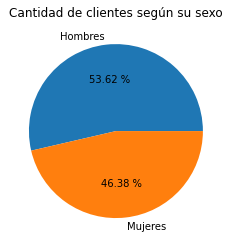

In [15]:
sexo = df['Sexo'].value_counts()
nombres = ['Hombres','Mujeres']
plt.title("Cantidad de clientes según su sexo")
plt.pie(sexo, labels = nombres ,autopct="%0.2f %%")
plt.show()

En esta ocasión tomamos la variable de sexo, ya que es una variable de tipo categórica, podemos asimilar que está medianamente equilibrada (inclinado un poco hacia los clientes masculinos) la cantidad de registros.

In [16]:
df['Renta']

1           NaN
2        143640
3        929106
4        172447
5        805250
          ...  
51120    364978
51121    625376
51122    806220
51123       NaN
51124    840878
Name: Renta, Length: 51124, dtype: object

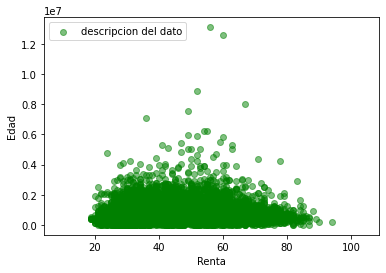

In [17]:
x = df['Edad']
y = df['Renta']

plt.scatter(x, y, c="g", alpha=0.5, label="descripcion del dato")
plt.xlabel("Renta")
plt.ylabel("Edad")
plt.legend(loc='upper left')
plt.show()

En esta parte podemos notar que la renta se acumula mayormente en el valor mínimo, no obstante se puede notar una dispersión parecida a lo que sería una campana de Gauss, es decir, los clientes de menor edad y mayor edad tienden a tener una renta menor, que los clientes que poseen la edad media de esta data

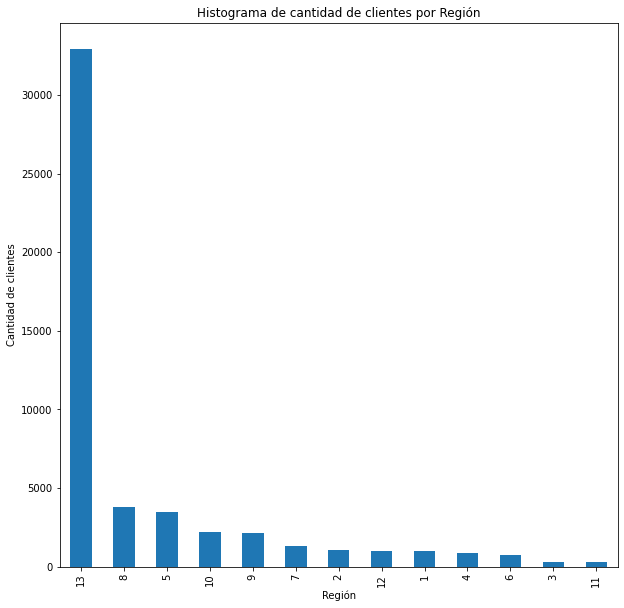

In [18]:
plt.figure(figsize=(10,10))
plt.xlabel('Región')
plt.ylabel('Cantidad de clientes')
plt.title('Histograma de cantidad de clientes por Región')
df.Region.value_counts().plot(kind = 'bar')

Podemos darnos cuenta que la décimo tercera región es la que más clientes posee con mucha diferencia respecto las demás regiones

## 2.1.5 Análisis a fondo con Profile Report

###IMPORTANTE! 
La data es extremadamente pesada, por ende se recomienda mucha paciencia si se ejecutarán los siguientes comandos, actualemente se está trabajando de forma remota desde una máquina de Google Colaboratory por lo cual el tiempo de ejecución es más extenso debido a las limitantes de las máquinas facilitadas por Google (precisamente de los procesadores de las mismas), por ende quedará de forma opcional ver si usted desea ejecutar el comando para un análisis extremadamente minucioso

Primero que nada instalaremos la dependencia a través del paquete de python

In [ ]:
pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip

Posterior a ello importamos los paquetes en el código fuente y realizamos la investigación necesaria, el cual generará una salida muy parecida a una página web con toda la información de la data ya más ordenada y estructurada

In [ ]:
from pandas_profiling import ProfileReport

ProfileReport(df)

# 3.1 Pre-Procesamiento

## 3.1.1 Tratamiento de datos nulos

Antes que nada imprimiremos las columnas que tenemos en nuestro dataframe para dimensionar esta etapa

In [19]:
df.columns.values

array(['Id', 'Subsegmento', 'Sexo', 'Region', 'Edad', 'Renta',
       'Antiguedad', 'Internauta', 'Adicional', 'Dualidad',
       'Monoproducto', 'Ctacte', 'Consumo', 'Hipotecario', 'Debito',
       'CambioPin', 'Cuentas', 'TC', 'CUPO_L1', 'CUPO_L2', 'CUPO_MX',
       'FlgAct_T12', 'FlgActCN_T12', 'FlgActCI_T12', 'FlgActAN_T12',
       'FlgActAI_T12', 'FlgActPAT_T12', 'FlgActCCPC_T12',
       'FlgActCCOT_T12', 'FlgActCOL_T12', 'Fac_T12', 'Txs_T12',
       'FacCN_T12', 'TxsCN_T12', 'FacCI_T12', 'TxsCI_T12', 'FacAN_T12',
       'TxsAN_T12', 'FacAI_T12', 'TxsAI_T12', 'FacPAT_T12', 'TxsPAT_T12',
       'FacCCPC_T12', 'TxsCCPC_T12', 'FacCCOT_T12', 'TxsCCOT_T12',
       'FacCOL_T12', 'TxsCOL_T12', 'FacDebCom_T12', 'TxsDebCom_T12',
       'FacDebAtm_T12', 'TxsDebAtm_T12', 'Col_T12', 'ColL1T0_T12',
       'ColL1TE_T12', 'ColL2T0_T12', 'ColL2AC_T12', 'ColL2CC_T12',
       'ColMx_T12', 'PagoNac_T12', 'PagoInt_T12', 'EeccNac_T12',
       'EeccInt_T12', 'UsoL1_T12', 'UsoL2_T12', 'UsoLI_T12', 'IndR

Como vimos con anterioridad La columna que más datos nulos posee es el "CambioPin", investiguemosla a fondo

In [20]:
df['CambioPin'].value_counts()

1    31736
Name: CambioPin, dtype: int64

Nos damos cuenta entonces que solo tiene valor 1, y esto se debe porque los valores vacíos corresponden a cero, es decir, el cliente que no a realizado un cambio de su pin por defecto tiene el valor NaN, arreglemoslo entonces imputando 0 a los valores vacíos

In [21]:
df['CambioPin'].fillna(value=0, inplace=True)
df

,Id,Subsegmento,Sexo,Region,Edad,Renta,Antiguedad,Internauta,Adicional,Dualidad,Monoproducto,Ctacte,Consumo,Hipotecario,Debito,CambioPin,Cuentas,TC,CUPO_L1,CUPO_L2,CUPO_MX,FlgAct_T12,FlgActCN_T12,FlgActCI_T12,FlgActAN_T12,FlgActAI_T12,FlgActPAT_T12,FlgActCCPC_T12,FlgActCCOT_T12,FlgActCOL_T12,Fac_T12,Txs_T12,FacCN_T12,TxsCN_T12,FacCI_T12,TxsCI_T12,FacAN_T12,TxsAN_T12,FacAI_T12,TxsAI_T12,...,FlgActCCOT_T01,FlgActCOL_T01,Fac_T01,Txs_T01,FacCN_T01,TxsCN_T01,FacCI_T01,TxsCI_T01,FacAN_T01,TxsAN_T01,FacAI_T01,TxsAI_T01,FacPAT_T01,TxsPAT_T01,FacCCPC_T01,TxsCCPC_T01,FacCCOT_T01,TxsCCOT_T01,FacCOL_T01,TxsCOL_T01,FacDebCom_T01,TxsDebCom_T01,FacDebAtm_T01,TxsDebAtm_T01,Col_T01,ColL1T0_T01,ColL1TE_T01,ColL2T0_T01,ColL2AC_T01,ColL2CC_T01,ColMx_T01,PagoNac_T01,PagoInt_T01,EeccNac_T01,EeccInt_T01,UsoL1_T01,UsoL2_T01,UsoLI_T01,IndRev_T01,target
1,1,160,M,13,43,NaN,130,1,1,0,0,1,0,0,1,0,1,3,798000,1012000,1210,1,1,0,0,0,0,1,0,0,55490,3,55490,3,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,204133,28,24000,2,1069735,0,1040339,0,0,29396,0,33000,0,1099866,0,1099866,15080,0,R,0
2,2,160,H,13,46,143640,69,1,0,0,0,1,0,1,0,0,1,1,750000,150000,1000,1,1,0,0,0,0,1,0,0,19813,1,19813,1,0,0,0,0,0,0,...,0,0,118247,1,118247,1,0,0,0,0,0,0,0,0,118247,1,0,0,0,0,0,0,0,0,211884,0,162939,48945,0,0,0,300000,0,214592,0,214592,83596,0,R,0
3,3,170,H,13,45,929106,24,1,1,0,0,1,0,1,1,1,1,2,1350000,200000,1500,1,1,0,0,0,0,0,0,0,123950,3,123950,3,0,0,0,0,0,0,...,0,0,191336,3,191336,3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,162161,9,519000,11,7400,7400,0,0,0,0,0,216676,0,0,0,7400,0,0,T,0
4,4,151,H,13,46,172447,134,0,1,0,1,0,0,0,0,1,1,2,1570800,220001,0,1,1,0,0,0,0,1,0,0,44470,3,44470,3,0,0,0,0,0,0,...,0,0,11890,1,11890,1,0,0,0,0,0,0,0,0,11890,1,0,0,0,0,0,0,0,0,262160,0,244048,18112,0,0,0,60000,0,272762,0,272762,10591,0,R,0
5,5,170,H,13,46,805250,116,0,1,1,0,1,0,1,0,1,2,3,2762000,2,6430,1,1,0,0,0,0,1,0,0,138225,6,138225,6,0,0,0,0,0,0,...,1,0,173576,10,173576,10,0,0,0,0,0,0,0,0,70808,3,47000,1,0,0,0,0,0,0,306161,60008,0,214125,0,32028,0,272925,0,249562,0,75339,377782,0,R,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
51120,51120,160,H,13,51,364978,57,1,1,1,0,1,0,0,1,1,2,3,999000,1000,550,1,1,0,0,0,0,1,1,0,78520,9,78520,9,0,0,0,0,0,0,...,0,0,62808,5,62808,5,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1112000,14,463255,62808,379646,20801,0,0,0,300000,0,478320,0,478320,12668,0,R,0
51121,51121,170,H,13,51,625376,39,1,0,0,0,1,0,0,1,1,1,1,1744200,1,300,1,0,0,0,0,1,0,0,0,6824,1,0,0,0,0,0,0,0,0,...,0,0,37783,1,0,0,0,0,0,0,0,0,37783,1,0,0,0,0,0,0,0,0,0,0,728406,37783,0,91896,0,598727,0,166098,0,166098,0,0,572363,0,R,0
51122,51122,160,H,13,47,806220,153,1,1,0,0,1,0,0,1,1,1,2,1061000,194700,1526,1,1,0,0,0,0,1,0,0,66040,3,66040,3,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,24373,0,24,0,0,24349,0,18891,0,9652,0,9652,16241,0,R,0
51123,51123,160,M,13,47,NaN,11,1,0,0,0,1,0,0,0,0,1,1,1612000,300000,2300,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0,108982,2,108982,2,0,0,0,0,0,0,0,0,84982,1,0,0,0,0,0,0,0,0,52360,24000,33,28327,0,0,0,26528,0,24638,0,24638,84982,0,R,0


¿Que pasa con la renta?, practicamente es una variable muy importante que nos servirá de mucho tenerla, sería muy mala opción si deseamos eliminarla, sacaremos el promedio y en base a ello imputaremos los valores que se perdieron

In [22]:
promedio_renta = df['Renta'].mean().astype(int)
df['Renta'].fillna(value= promedio_renta, inplace = True)
print(df['Renta'])
print('El promedio de la renta anual de los usuarios es de:',promedio_renta)

1        663077.0
2        143640.0
3        929106.0
4        172447.0
5        805250.0
           ...   
51120    364978.0
51121    625376.0
51122    806220.0
51123    663077.0
51124    840878.0
Name: Renta, Length: 51124, dtype: float64
El promedio de la renta anual de los usuarios es de: 663077


In [23]:
df.iloc[:, 0:21].isnull().sum()

0
Id               0
Subsegmento      0
Sexo             1
Region          53
Edad             0
Renta            0
Antiguedad       0
Internauta       0
Adicional        0
Dualidad         0
Monoproducto     0
Ctacte           0
Consumo          0
Hipotecario      0
Debito           0
CambioPin        0
Cuentas          0
TC               0
CUPO_L1          0
CUPO_L2          0
CUPO_MX          0
dtype: int64

Dentro de los macro datos a nivel general encontramos con que la región posee una cantidad considerable de valores perdidos, en este caso lo reemplazaremos por la moda, ¿por qué?, porque la posibilidad de ser de la región mas propensa en esta data es extremadamente alto

In [24]:
region_moda = df['Region'].mode().astype(int)
df['Region'].fillna(value= region_moda, inplace = True)
print(df['Region'])
print('La región que posee la mayor cantidad de clientes es la:', region_moda)

1        13.0
2        13.0
3        13.0
4        13.0
5        13.0
         ... 
51120    13.0
51121    13.0
51122    13.0
51123    13.0
51124    13.0
Name: Region, Length: 51124, dtype: float64
La región que posee la mayor cantidad de clientes es la: 0    13
dtype: int64


Finalmente pasamos a rellenar con 0 los valores perdidos dentro de nuestra data específica, esto lo haremos ya que la mayoría de valores son cuantitativos discretos o cuantitativos continuos, en los cuales en algunas ocasiones se valida si existe dicho registro o no, por ende lo más sensato sería establecer todo como 0

In [25]:
df.fillna(0, inplace=True)
df

,Id,Subsegmento,Sexo,Region,Edad,Renta,Antiguedad,Internauta,Adicional,Dualidad,Monoproducto,Ctacte,Consumo,Hipotecario,Debito,CambioPin,Cuentas,TC,CUPO_L1,CUPO_L2,CUPO_MX,FlgAct_T12,FlgActCN_T12,FlgActCI_T12,FlgActAN_T12,FlgActAI_T12,FlgActPAT_T12,FlgActCCPC_T12,FlgActCCOT_T12,FlgActCOL_T12,Fac_T12,Txs_T12,FacCN_T12,TxsCN_T12,FacCI_T12,TxsCI_T12,FacAN_T12,TxsAN_T12,FacAI_T12,TxsAI_T12,...,FlgActCCOT_T01,FlgActCOL_T01,Fac_T01,Txs_T01,FacCN_T01,TxsCN_T01,FacCI_T01,TxsCI_T01,FacAN_T01,TxsAN_T01,FacAI_T01,TxsAI_T01,FacPAT_T01,TxsPAT_T01,FacCCPC_T01,TxsCCPC_T01,FacCCOT_T01,TxsCCOT_T01,FacCOL_T01,TxsCOL_T01,FacDebCom_T01,TxsDebCom_T01,FacDebAtm_T01,TxsDebAtm_T01,Col_T01,ColL1T0_T01,ColL1TE_T01,ColL2T0_T01,ColL2AC_T01,ColL2CC_T01,ColMx_T01,PagoNac_T01,PagoInt_T01,EeccNac_T01,EeccInt_T01,UsoL1_T01,UsoL2_T01,UsoLI_T01,IndRev_T01,target
1,1,160,M,13.0,43,663077.0,130,1,1,0,0,1,0,0,1,0,1,3,798000,1012000.0,1210.0,1,1,0,0,0,0,1,0,0,55490.0,3,55490.0,3,0.0,0,0,0,0.0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,204133,28,24000,2,1069735.0,0,1040339.0,0,0,29396,0.0,33000,0.0,1099866.0,0.0,1099866.0,15080,0.0,R,0
2,2,160,H,13.0,46,143640.0,69,1,0,0,0,1,0,1,0,0,1,1,750000,150000.0,1000.0,1,1,0,0,0,0,1,0,0,19813.0,1,19813.0,1,0.0,0,0,0,0.0,0,...,0,0,118247,1,118247,1,0,0,0,0,0,0,0,0,118247,1,0,0,0,0,0,0,0,0,211884.0,0,162939.0,48945,0,0,0.0,300000,0.0,214592.0,0.0,214592.0,83596,0.0,R,0
3,3,170,H,13.0,45,929106.0,24,1,1,0,0,1,0,1,1,1,1,2,1350000,200000.0,1500.0,1,1,0,0,0,0,0,0,0,123950.0,3,123950.0,3,0.0,0,0,0,0.0,0,...,0,0,191336,3,191336,3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,162161,9,519000,11,7400.0,7400,0.0,0,0,0,0.0,216676,0.0,0.0,0.0,7400.0,0,0.0,T,0
4,4,151,H,13.0,46,172447.0,134,0,1,0,1,0,0,0,0,1,1,2,1570800,220001.0,0.0,1,1,0,0,0,0,1,0,0,44470.0,3,44470.0,3,0.0,0,0,0,0.0,0,...,0,0,11890,1,11890,1,0,0,0,0,0,0,0,0,11890,1,0,0,0,0,0,0,0,0,262160.0,0,244048.0,18112,0,0,0.0,60000,0.0,272762.0,0.0,272762.0,10591,0.0,R,0
5,5,170,H,13.0,46,805250.0,116,0,1,1,0,1,0,1,0,1,2,3,2762000,2.0,6430.0,1,1,0,0,0,0,1,0,0,138225.0,6,138225.0,6,0.0,0,0,0,0.0,0,...,1,0,173576,10,173576,10,0,0,0,0,0,0,0,0,70808,3,47000,1,0,0,0,0,0,0,306161.0,60008,0.0,214125,0,32028,0.0,272925,0.0,249562.0,0.0,75339.0,377782,0.0,R,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
51120,51120,160,H,13.0,51,364978.0,57,1,1,1,0,1,0,0,1,1,2,3,999000,1000.0,550.0,1,1,0,0,0,0,1,1,0,78520.0,9,78520.0,9,0.0,0,0,0,0.0,0,...,0,0,62808,5,62808,5,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1112000,14,463255.0,62808,379646.0,20801,0,0,0.0,300000,0.0,478320.0,0.0,478320.0,12668,0.0,R,0
51121,51121,170,H,13.0,51,625376.0,39,1,0,0,0,1,0,0,1,1,1,1,1744200,1.0,300.0,1,0,0,0,0,1,0,0,0,6824.0,1,0.0,0,0.0,0,0,0,0.0,0,...,0,0,37783,1,0,0,0,0,0,0,0,0,37783,1,0,0,0,0,0,0,0,0,0,0,728406.0,37783,0.0,91896,0,598727,0.0,166098,0.0,166098.0,0.0,0.0,572363,0.0,R,0
51122,51122,160,H,13.0,47,806220.0,153,1,1,0,0,1,0,0,1,1,1,2,1061000,194700.0,1526.0,1,1,0,0,0,0,1,0,0,66040.0,3,66040.0,3,0.0,0,0,0,0.0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,24373.0,0,24.0,0,0,24349,0.0,18891,0.0,9652.0,0.0,9652.0,16241,0.0,R,0
51123,51123,160,M,13.0,47,663077.0,11,1,0,0,0,1,0,0,0,0,1,1,1612000,300000.0,2300.0,0,0,0,0,0,0,0,0,0,0.0,0,0.0,0,0.0,0,0,0,0.0,0,...,0,0,108982,2,108982,2,0,0,0,0,0,0,0,0,84982,1,0,0,0,0,0,0,0,0,52360.0,24000,33.0,28327,0,0,0.0,26528,0.0,24638.0,0.0,24638.0,84982,0.0,R,0


In [26]:
cantidad_Total = df.isnull().sum().sum()
print('La cantidad de valores nulos total que quedan en la data es de:',cantidad_Total)

La cantidad de valores nulos total que quedan en la data es de: 0


## 3.1.2 Label encode
El label encode es un tipo de transformación de datos en los cuales transforma datos de carácter cualitativo ordinal en datos cuantitativos discretos, rigiendose por numeraciones de menor a mayor.
En esta ocasión no usaremos label encoder, ya que están definidos por defecto las columnas ordinales con este formato.

## 3.1.3 One Hot Encode
El one hot encode es un tipo de transformación de datos en los cuales transforma datos de carácter cualitativo nominal en datos cuantitativos binarios, rigiendose por la creación de nuevas columnas y determinando a qué columna pertenece tal registro.

Empezaremos encodeando el sexo, ya que no tiene un orden jerárquico y es una variable general, es decir, no está organizada por meses

In [27]:
sexo_dummy = pd.get_dummies(df['Sexo'], prefix='Sexo')
print(sexo_dummy)

       Sexo_0  Sexo_H  Sexo_M
1           0       0       1
2           0       1       0
3           0       1       0
4           0       1       0
5           0       1       0
...       ...     ...     ...
51120       0       1       0
51121       0       1       0
51122       0       1       0
51123       0       0       1
51124       0       1       0

[51124 rows x 3 columns]


Entonces los resultados que se imprimieron con anterioridad se unirán al dataframe

In [28]:
df = pd.concat([df, sexo_dummy], axis = 1)
df

,Id,Subsegmento,Sexo,Region,Edad,Renta,Antiguedad,Internauta,Adicional,Dualidad,Monoproducto,Ctacte,Consumo,Hipotecario,Debito,CambioPin,Cuentas,TC,CUPO_L1,CUPO_L2,CUPO_MX,FlgAct_T12,FlgActCN_T12,FlgActCI_T12,FlgActAN_T12,FlgActAI_T12,FlgActPAT_T12,FlgActCCPC_T12,FlgActCCOT_T12,FlgActCOL_T12,Fac_T12,Txs_T12,FacCN_T12,TxsCN_T12,FacCI_T12,TxsCI_T12,FacAN_T12,TxsAN_T12,FacAI_T12,TxsAI_T12,...,Txs_T01,FacCN_T01,TxsCN_T01,FacCI_T01,TxsCI_T01,FacAN_T01,TxsAN_T01,FacAI_T01,TxsAI_T01,FacPAT_T01,TxsPAT_T01,FacCCPC_T01,TxsCCPC_T01,FacCCOT_T01,TxsCCOT_T01,FacCOL_T01,TxsCOL_T01,FacDebCom_T01,TxsDebCom_T01,FacDebAtm_T01,TxsDebAtm_T01,Col_T01,ColL1T0_T01,ColL1TE_T01,ColL2T0_T01,ColL2AC_T01,ColL2CC_T01,ColMx_T01,PagoNac_T01,PagoInt_T01,EeccNac_T01,EeccInt_T01,UsoL1_T01,UsoL2_T01,UsoLI_T01,IndRev_T01,target,Sexo_0,Sexo_H,Sexo_M
1,1,160,M,13.0,43,663077.0,130,1,1,0,0,1,0,0,1,0,1,3,798000,1012000.0,1210.0,1,1,0,0,0,0,1,0,0,55490.0,3,55490.0,3,0.0,0,0,0,0.0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,204133,28,24000,2,1069735.0,0,1040339.0,0,0,29396,0.0,33000,0.0,1099866.0,0.0,1099866.0,15080,0.0,R,0,0,0,1
2,2,160,H,13.0,46,143640.0,69,1,0,0,0,1,0,1,0,0,1,1,750000,150000.0,1000.0,1,1,0,0,0,0,1,0,0,19813.0,1,19813.0,1,0.0,0,0,0,0.0,0,...,1,118247,1,0,0,0,0,0,0,0,0,118247,1,0,0,0,0,0,0,0,0,211884.0,0,162939.0,48945,0,0,0.0,300000,0.0,214592.0,0.0,214592.0,83596,0.0,R,0,0,1,0
3,3,170,H,13.0,45,929106.0,24,1,1,0,0,1,0,1,1,1,1,2,1350000,200000.0,1500.0,1,1,0,0,0,0,0,0,0,123950.0,3,123950.0,3,0.0,0,0,0,0.0,0,...,3,191336,3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,162161,9,519000,11,7400.0,7400,0.0,0,0,0,0.0,216676,0.0,0.0,0.0,7400.0,0,0.0,T,0,0,1,0
4,4,151,H,13.0,46,172447.0,134,0,1,0,1,0,0,0,0,1,1,2,1570800,220001.0,0.0,1,1,0,0,0,0,1,0,0,44470.0,3,44470.0,3,0.0,0,0,0,0.0,0,...,1,11890,1,0,0,0,0,0,0,0,0,11890,1,0,0,0,0,0,0,0,0,262160.0,0,244048.0,18112,0,0,0.0,60000,0.0,272762.0,0.0,272762.0,10591,0.0,R,0,0,1,0
5,5,170,H,13.0,46,805250.0,116,0,1,1,0,1,0,1,0,1,2,3,2762000,2.0,6430.0,1,1,0,0,0,0,1,0,0,138225.0,6,138225.0,6,0.0,0,0,0,0.0,0,...,10,173576,10,0,0,0,0,0,0,0,0,70808,3,47000,1,0,0,0,0,0,0,306161.0,60008,0.0,214125,0,32028,0.0,272925,0.0,249562.0,0.0,75339.0,377782,0.0,R,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
51120,51120,160,H,13.0,51,364978.0,57,1,1,1,0,1,0,0,1,1,2,3,999000,1000.0,550.0,1,1,0,0,0,0,1,1,0,78520.0,9,78520.0,9,0.0,0,0,0,0.0,0,...,5,62808,5,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1112000,14,463255.0,62808,379646.0,20801,0,0,0.0,300000,0.0,478320.0,0.0,478320.0,12668,0.0,R,0,0,1,0
51121,51121,170,H,13.0,51,625376.0,39,1,0,0,0,1,0,0,1,1,1,1,1744200,1.0,300.0,1,0,0,0,0,1,0,0,0,6824.0,1,0.0,0,0.0,0,0,0,0.0,0,...,1,0,0,0,0,0,0,0,0,37783,1,0,0,0,0,0,0,0,0,0,0,728406.0,37783,0.0,91896,0,598727,0.0,166098,0.0,166098.0,0.0,0.0,572363,0.0,R,0,0,1,0
51122,51122,160,H,13.0,47,806220.0,153,1,1,0,0,1,0,0,1,1,1,2,1061000,194700.0,1526.0,1,1,0,0,0,0,1,0,0,66040.0,3,66040.0,3,0.0,0,0,0,0.0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,24373.0,0,24.0,0,0,24349,0.0,18891,0.0,9652.0,0.0,9652.0,16241,0.0,R,0,0,1,0
51123,51123,160,M,13.0,47,663077.0,11,1,0,0,0,1,0,0,0,0,1,1,1612000,300000.0,2300.0,0,0,0,0,0,0,0,0,0,0.0,0,0.0,0,0.0,0,0,0,0.0,0,...,2,108982,2,0,0,0,0,0,0,0,0,84982,1,0,0,0,0,0,0,0,0,52360.0,24000,33.0,28327,0,0,0.0,26528,0.0,24638.0,0.0,24638.0,84982,0.0,R,0,0,0,1


Acá simplemente eliminamos la columna madre de la cual se encodeó 

In [29]:
df.drop(['Sexo'], axis=1, inplace = True)
df

,Id,Subsegmento,Region,Edad,Renta,Antiguedad,Internauta,Adicional,Dualidad,Monoproducto,Ctacte,Consumo,Hipotecario,Debito,CambioPin,Cuentas,TC,CUPO_L1,CUPO_L2,CUPO_MX,FlgAct_T12,FlgActCN_T12,FlgActCI_T12,FlgActAN_T12,FlgActAI_T12,FlgActPAT_T12,FlgActCCPC_T12,FlgActCCOT_T12,FlgActCOL_T12,Fac_T12,Txs_T12,FacCN_T12,TxsCN_T12,FacCI_T12,TxsCI_T12,FacAN_T12,TxsAN_T12,FacAI_T12,TxsAI_T12,FacPAT_T12,...,Txs_T01,FacCN_T01,TxsCN_T01,FacCI_T01,TxsCI_T01,FacAN_T01,TxsAN_T01,FacAI_T01,TxsAI_T01,FacPAT_T01,TxsPAT_T01,FacCCPC_T01,TxsCCPC_T01,FacCCOT_T01,TxsCCOT_T01,FacCOL_T01,TxsCOL_T01,FacDebCom_T01,TxsDebCom_T01,FacDebAtm_T01,TxsDebAtm_T01,Col_T01,ColL1T0_T01,ColL1TE_T01,ColL2T0_T01,ColL2AC_T01,ColL2CC_T01,ColMx_T01,PagoNac_T01,PagoInt_T01,EeccNac_T01,EeccInt_T01,UsoL1_T01,UsoL2_T01,UsoLI_T01,IndRev_T01,target,Sexo_0,Sexo_H,Sexo_M
1,1,160,13.0,43,663077.0,130,1,1,0,0,1,0,0,1,0,1,3,798000,1012000.0,1210.0,1,1,0,0,0,0,1,0,0,55490.0,3,55490.0,3,0.0,0,0,0,0.0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,204133,28,24000,2,1069735.0,0,1040339.0,0,0,29396,0.0,33000,0.0,1099866.0,0.0,1099866.0,15080,0.0,R,0,0,0,1
2,2,160,13.0,46,143640.0,69,1,0,0,0,1,0,1,0,0,1,1,750000,150000.0,1000.0,1,1,0,0,0,0,1,0,0,19813.0,1,19813.0,1,0.0,0,0,0,0.0,0,0,...,1,118247,1,0,0,0,0,0,0,0,0,118247,1,0,0,0,0,0,0,0,0,211884.0,0,162939.0,48945,0,0,0.0,300000,0.0,214592.0,0.0,214592.0,83596,0.0,R,0,0,1,0
3,3,170,13.0,45,929106.0,24,1,1,0,0,1,0,1,1,1,1,2,1350000,200000.0,1500.0,1,1,0,0,0,0,0,0,0,123950.0,3,123950.0,3,0.0,0,0,0,0.0,0,0,...,3,191336,3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,162161,9,519000,11,7400.0,7400,0.0,0,0,0,0.0,216676,0.0,0.0,0.0,7400.0,0,0.0,T,0,0,1,0
4,4,151,13.0,46,172447.0,134,0,1,0,1,0,0,0,0,1,1,2,1570800,220001.0,0.0,1,1,0,0,0,0,1,0,0,44470.0,3,44470.0,3,0.0,0,0,0,0.0,0,0,...,1,11890,1,0,0,0,0,0,0,0,0,11890,1,0,0,0,0,0,0,0,0,262160.0,0,244048.0,18112,0,0,0.0,60000,0.0,272762.0,0.0,272762.0,10591,0.0,R,0,0,1,0
5,5,170,13.0,46,805250.0,116,0,1,1,0,1,0,1,0,1,2,3,2762000,2.0,6430.0,1,1,0,0,0,0,1,0,0,138225.0,6,138225.0,6,0.0,0,0,0,0.0,0,0,...,10,173576,10,0,0,0,0,0,0,0,0,70808,3,47000,1,0,0,0,0,0,0,306161.0,60008,0.0,214125,0,32028,0.0,272925,0.0,249562.0,0.0,75339.0,377782,0.0,R,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
51120,51120,160,13.0,51,364978.0,57,1,1,1,0,1,0,0,1,1,2,3,999000,1000.0,550.0,1,1,0,0,0,0,1,1,0,78520.0,9,78520.0,9,0.0,0,0,0,0.0,0,0,...,5,62808,5,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1112000,14,463255.0,62808,379646.0,20801,0,0,0.0,300000,0.0,478320.0,0.0,478320.0,12668,0.0,R,0,0,1,0
51121,51121,170,13.0,51,625376.0,39,1,0,0,0,1,0,0,1,1,1,1,1744200,1.0,300.0,1,0,0,0,0,1,0,0,0,6824.0,1,0.0,0,0.0,0,0,0,0.0,0,6824,...,1,0,0,0,0,0,0,0,0,37783,1,0,0,0,0,0,0,0,0,0,0,728406.0,37783,0.0,91896,0,598727,0.0,166098,0.0,166098.0,0.0,0.0,572363,0.0,R,0,0,1,0
51122,51122,160,13.0,47,806220.0,153,1,1,0,0,1,0,0,1,1,1,2,1061000,194700.0,1526.0,1,1,0,0,0,0,1,0,0,66040.0,3,66040.0,3,0.0,0,0,0,0.0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,24373.0,0,24.0,0,0,24349,0.0,18891,0.0,9652.0,0.0,9652.0,16241,0.0,R,0,0,1,0
51123,51123,160,13.0,47,663077.0,11,1,0,0,0,1,0,0,0,0,1,1,1612000,300000.0,2300.0,0,0,0,0,0,0,0,0,0,0.0,0,0.0,0,0.0,0,0,0,0.0,0,0,...,2,108982,2,0,0,0,0,0,0,0,0,84982,1,0,0,0,0,0,0,0,0,52360.0,24000,33.0,28327,0,0,0.0,26528,0.0,24638.0,0.0,24638.0,84982,0.0,R,0,0,0,1


Acá trataremos de resumir todo lo visto con anterioridad en la sección anterior en un bloque de código con una variable que se repite en la data ya que está dividida en meses, trataremos de optimizar el código al extremo usando buenas prácticas y aplicando DRY (Dont Repeat Yourself)

In [30]:
IndRev_dummy = ['IndRev_T01', 'IndRev_T02', 'IndRev_T03', 'IndRev_T04','IndRev_T05','IndRev_T06','IndRev_T07','IndRev_T08','IndRev_T09','IndRev_T10','IndRev_T11','IndRev_T12']
for variable in IndRev_dummy:
  variable_dummeada = pd.get_dummies(df[variable], prefix=variable)
  df.drop([variable], axis=1, inplace=True)
  df = pd.concat([df, variable_dummeada], axis = 1)
df

,Id,Subsegmento,Region,Edad,Renta,Antiguedad,Internauta,Adicional,Dualidad,Monoproducto,Ctacte,Consumo,Hipotecario,Debito,CambioPin,Cuentas,TC,CUPO_L1,CUPO_L2,CUPO_MX,FlgAct_T12,FlgActCN_T12,FlgActCI_T12,FlgActAN_T12,FlgActAI_T12,FlgActPAT_T12,FlgActCCPC_T12,FlgActCCOT_T12,FlgActCOL_T12,Fac_T12,Txs_T12,FacCN_T12,TxsCN_T12,FacCI_T12,TxsCI_T12,FacAN_T12,TxsAN_T12,FacAI_T12,TxsAI_T12,FacPAT_T12,...,IndRev_T03_0,IndRev_T03_P,IndRev_T03_R,IndRev_T03_T,IndRev_T04_0,IndRev_T04_P,IndRev_T04_R,IndRev_T04_T,IndRev_T05_0,IndRev_T05_P,IndRev_T05_R,IndRev_T05_T,IndRev_T06_0,IndRev_T06_P,IndRev_T06_R,IndRev_T06_T,IndRev_T07_0,IndRev_T07_P,IndRev_T07_R,IndRev_T07_T,IndRev_T08_0,IndRev_T08_P,IndRev_T08_R,IndRev_T08_T,IndRev_T09_0,IndRev_T09_P,IndRev_T09_R,IndRev_T09_T,IndRev_T10_0,IndRev_T10_P,IndRev_T10_R,IndRev_T10_T,IndRev_T11_0,IndRev_T11_P,IndRev_T11_R,IndRev_T11_T,IndRev_T12_0,IndRev_T12_P,IndRev_T12_R,IndRev_T12_T
1,1,160,13.0,43,663077.0,130,1,1,0,0,1,0,0,1,0,1,3,798000,1012000.0,1210.0,1,1,0,0,0,0,1,0,0,55490.0,3,55490.0,3,0.0,0,0,0,0.0,0,0,...,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0
2,2,160,13.0,46,143640.0,69,1,0,0,0,1,0,1,0,0,1,1,750000,150000.0,1000.0,1,1,0,0,0,0,1,0,0,19813.0,1,19813.0,1,0.0,0,0,0,0.0,0,0,...,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0
3,3,170,13.0,45,929106.0,24,1,1,0,0,1,0,1,1,1,1,2,1350000,200000.0,1500.0,1,1,0,0,0,0,0,0,0,123950.0,3,123950.0,3,0.0,0,0,0,0.0,0,0,...,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,1,0,0,0,0,1
4,4,151,13.0,46,172447.0,134,0,1,0,1,0,0,0,0,1,1,2,1570800,220001.0,0.0,1,1,0,0,0,0,1,0,0,44470.0,3,44470.0,3,0.0,0,0,0,0.0,0,0,...,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0
5,5,170,13.0,46,805250.0,116,0,1,1,0,1,0,1,0,1,2,3,2762000,2.0,6430.0,1,1,0,0,0,0,1,0,0,138225.0,6,138225.0,6,0.0,0,0,0,0.0,0,0,...,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
51120,51120,160,13.0,51,364978.0,57,1,1,1,0,1,0,0,1,1,2,3,999000,1000.0,550.0,1,1,0,0,0,0,1,1,0,78520.0,9,78520.0,9,0.0,0,0,0,0.0,0,0,...,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0
51121,51121,170,13.0,51,625376.0,39,1,0,0,0,1,0,0,1,1,1,1,1744200,1.0,300.0,1,0,0,0,0,1,0,0,0,6824.0,1,0.0,0,0.0,0,0,0,0.0,0,6824,...,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,1,0
51122,51122,160,13.0,47,806220.0,153,1,1,0,0,1,0,0,1,1,1,2,1061000,194700.0,1526.0,1,1,0,0,0,0,1,0,0,66040.0,3,66040.0,3,0.0,0,0,0,0.0,0,0,...,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,1,0,1,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,1,0
51123,51123,160,13.0,47,663077.0,11,1,0,0,0,1,0,0,0,0,1,1,1612000,300000.0,2300.0,0,0,0,0,0,0,0,0,0,0.0,0,0.0,0,0.0,0,0,0,0.0,0,0,...,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,1,1,0,0,0,1,0,0,0


## 3.1.4 Limpiando y organizando outliers

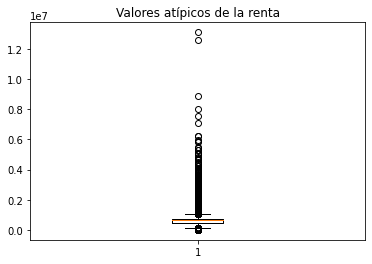

In [31]:
plt.title('Valores atípicos de la renta')
plt.boxplot(df['Renta'])
plt.show()

Acá logramos encontrar de forma básica valores atípicos dentro de nuestro dataframe, en este caso los limpiaremos

In [32]:
renta = df['Renta']

EQ1 = renta.quantile(0.25)
print("Primer cuartil", EQ1)
EQ3 = renta.quantile(0.75)
print("Tercer cuartil", EQ3)
EIQR = EQ3 - EQ1
print("Rango intercuartil", EIQR)
RentaMediana = renta.median()
print("Mediana", RentaMediana)
RentaValorMaximo = renta.max()
print("Valor máximo", RentaValorMaximo)
RentaValorMinimo = renta.min()
print("Valor mínimo", RentaValorMinimo)

Primer cuartil 466965.5
Tercer cuartil 709500.25
Rango intercuartil 242534.75
Mediana 663077.0
Valor máximo 13089327.0
Valor mínimo 1.0


Procederemos entonces a calcular los valores del bigote inferior y del bigote superior

In [33]:
BI_calculado = (EQ1 - 1.5 * EIQR)
print("BI calculado", BI_calculado)
BS_calculado = (EQ1 + 1.5 * EIQR)
print("BS calculado", BS_calculado)

BI calculado 103163.375
BS calculado 830767.625


procederemos entonces a establecer la ubicación de outliers

In [34]:
ubicacio_outliers = (renta< BI_calculado) | (renta> BS_calculado)
print("ubicación de outliers",ubicacio_outliers )

ubicación de outliers 1        False
2        False
3         True
4        False
5        False
         ...  
51120    False
51121    False
51122    False
51123    False
51124     True
Name: Renta, Length: 51124, dtype: bool


Procedemos a dejar la data limpia de los valores atípicos, en este caso de la renta

In [35]:
data_sin_outliers = (renta>= BI_calculado) & (renta<= BS_calculado)
df = df[data_sin_outliers]
df

,Id,Subsegmento,Region,Edad,Renta,Antiguedad,Internauta,Adicional,Dualidad,Monoproducto,Ctacte,Consumo,Hipotecario,Debito,CambioPin,Cuentas,TC,CUPO_L1,CUPO_L2,CUPO_MX,FlgAct_T12,FlgActCN_T12,FlgActCI_T12,FlgActAN_T12,FlgActAI_T12,FlgActPAT_T12,FlgActCCPC_T12,FlgActCCOT_T12,FlgActCOL_T12,Fac_T12,Txs_T12,FacCN_T12,TxsCN_T12,FacCI_T12,TxsCI_T12,FacAN_T12,TxsAN_T12,FacAI_T12,TxsAI_T12,FacPAT_T12,...,IndRev_T03_0,IndRev_T03_P,IndRev_T03_R,IndRev_T03_T,IndRev_T04_0,IndRev_T04_P,IndRev_T04_R,IndRev_T04_T,IndRev_T05_0,IndRev_T05_P,IndRev_T05_R,IndRev_T05_T,IndRev_T06_0,IndRev_T06_P,IndRev_T06_R,IndRev_T06_T,IndRev_T07_0,IndRev_T07_P,IndRev_T07_R,IndRev_T07_T,IndRev_T08_0,IndRev_T08_P,IndRev_T08_R,IndRev_T08_T,IndRev_T09_0,IndRev_T09_P,IndRev_T09_R,IndRev_T09_T,IndRev_T10_0,IndRev_T10_P,IndRev_T10_R,IndRev_T10_T,IndRev_T11_0,IndRev_T11_P,IndRev_T11_R,IndRev_T11_T,IndRev_T12_0,IndRev_T12_P,IndRev_T12_R,IndRev_T12_T
1,1,160,13.0,43,663077.0,130,1,1,0,0,1,0,0,1,0,1,3,798000,1012000.0,1210.0,1,1,0,0,0,0,1,0,0,55490.0,3,55490.0,3,0.0,0,0,0,0.0,0,0,...,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0
2,2,160,13.0,46,143640.0,69,1,0,0,0,1,0,1,0,0,1,1,750000,150000.0,1000.0,1,1,0,0,0,0,1,0,0,19813.0,1,19813.0,1,0.0,0,0,0,0.0,0,0,...,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0
4,4,151,13.0,46,172447.0,134,0,1,0,1,0,0,0,0,1,1,2,1570800,220001.0,0.0,1,1,0,0,0,0,1,0,0,44470.0,3,44470.0,3,0.0,0,0,0,0.0,0,0,...,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0
5,5,170,13.0,46,805250.0,116,0,1,1,0,1,0,1,0,1,2,3,2762000,2.0,6430.0,1,1,0,0,0,0,1,0,0,138225.0,6,138225.0,6,0.0,0,0,0,0.0,0,0,...,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1
6,6,170,13.0,47,707664.0,67,1,1,0,0,1,0,0,1,1,1,2,1312500,450000.0,714.0,1,1,0,0,0,0,1,1,0,134990.0,2,134990.0,2,0.0,0,0,0,0.0,0,0,...,0,1,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,1,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
51119,51119,160,13.0,44,414316.0,23,1,0,1,0,1,0,0,1,0,2,2,1020000,440000.0,1600.0,1,0,0,0,0,1,0,0,0,3500.0,1,0.0,0,0.0,0,0,0,0.0,0,3500,...,0,0,0,1,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0
51120,51120,160,13.0,51,364978.0,57,1,1,1,0,1,0,0,1,1,2,3,999000,1000.0,550.0,1,1,0,0,0,0,1,1,0,78520.0,9,78520.0,9,0.0,0,0,0,0.0,0,0,...,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0
51121,51121,170,13.0,51,625376.0,39,1,0,0,0,1,0,0,1,1,1,1,1744200,1.0,300.0,1,0,0,0,0,1,0,0,0,6824.0,1,0.0,0,0.0,0,0,0,0.0,0,6824,...,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,1,0
51122,51122,160,13.0,47,806220.0,153,1,1,0,0,1,0,0,1,1,1,2,1061000,194700.0,1526.0,1,1,0,0,0,0,1,0,0,66040.0,3,66040.0,3,0.0,0,0,0,0.0,0,0,...,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,1,0,1,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,1,0


## 3.1.5 Comparativa de graficos con el pre-procesamiento

Anteriormente pudimos contemplar que la data en relación a la edad y la renta quedó de esta forma

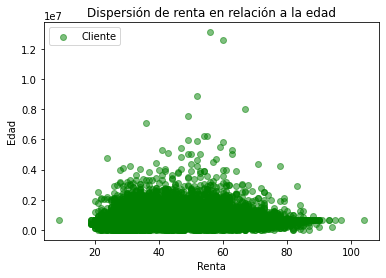

In [ ]:
x = df['Edad']
y = df['Renta']
plt.scatter(x, y, c="g", alpha=0.5, label="Cliente")
plt.title('Dispersión de renta en relación a la edad')
plt.xlabel("Renta")
plt.ylabel("Edad")
plt.legend(loc='upper left')
plt.show()

Después de la limpieza, la dispersión de datos quedó de esta forma

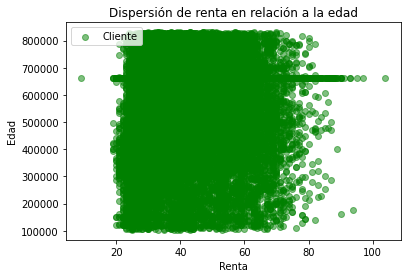

In [ ]:
x = sin_outliers['Edad']
y = sin_outliers['Renta']
plt.scatter(x, y, c="g", alpha=0.5, label="Cliente")
plt.title('Dispersión de renta en relación a la edad')
plt.xlabel("Renta")
plt.ylabel("Edad")
plt.legend(loc='upper left')
plt.show()

# 4.1 Modelo supervisado de regresión
Nuestros primeros modelos predictivos serán de tipo supervisado, ¿qué quiere decir esto?, simplemente trataremos de predecir algun valor de una columna del dataframe, a ese valor que vamos a predecir lo llamaremos etiqueta. Esto será en base a las variables que tengan algún tipo de relación dependiendo del algoritmo, se detallará más adelante y se detallará a fondo en el algoritmo seleccionado.

##4.1.1 Regresión lineal
El algoritmo de regresión lineal es un algoritmo de tipo supervisado y de regresión como lo indica su nombre, este algoritmo principalmente se basa en establecer una relación proporcionalmente ascendente de forma directa entre una variable y la etiqueta. Esto quiere decir que de acuerdo a un valor como parámetro tratará de predecir su resultado. Veamos como funciona esto y si estaría correcto usarlo en esta ocasión.

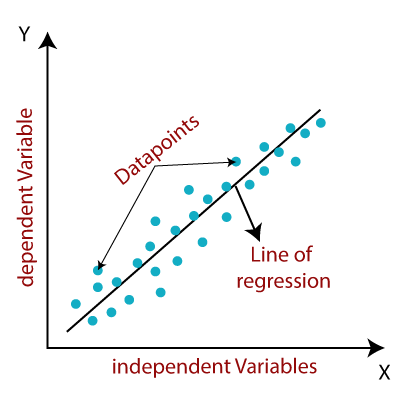

En este caso realizaremos una matriz de correlación para verificar que variables tienen la mayor proporción.

In [ ]:
df.corr()

,Id,Subsegmento,Region,Edad,Renta,Antiguedad,Internauta,Adicional,Dualidad,Monoproducto,Ctacte,Consumo,Hipotecario,Debito,CambioPin,Cuentas,TC,CUPO_L1,CUPO_L2,CUPO_MX,FlgAct_T12,FlgActCN_T12,FlgActCI_T12,FlgActAN_T12,FlgActAI_T12,FlgActPAT_T12,FlgActCCPC_T12,FlgActCCOT_T12,FlgActCOL_T12,Fac_T12,Txs_T12,FacCN_T12,TxsCN_T12,FacCI_T12,TxsCI_T12,FacAN_T12,TxsAN_T12,FacAI_T12,TxsAI_T12,FacPAT_T12,...,IndRev_T03_0,IndRev_T03_P,IndRev_T03_R,IndRev_T03_T,IndRev_T04_0,IndRev_T04_P,IndRev_T04_R,IndRev_T04_T,IndRev_T05_0,IndRev_T05_P,IndRev_T05_R,IndRev_T05_T,IndRev_T06_0,IndRev_T06_P,IndRev_T06_R,IndRev_T06_T,IndRev_T07_0,IndRev_T07_P,IndRev_T07_R,IndRev_T07_T,IndRev_T08_0,IndRev_T08_P,IndRev_T08_R,IndRev_T08_T,IndRev_T09_0,IndRev_T09_P,IndRev_T09_R,IndRev_T09_T,IndRev_T10_0,IndRev_T10_P,IndRev_T10_R,IndRev_T10_T,IndRev_T11_0,IndRev_T11_P,IndRev_T11_R,IndRev_T11_T,IndRev_T12_0,IndRev_T12_P,IndRev_T12_R,IndRev_T12_T
Id,1.000000,0.079030,-0.016385,0.298332,0.062187,0.144475,-0.151180,0.042792,-0.107526,0.088221,-0.080719,0.003211,-0.089862,-0.123010,-0.001960,-0.102522,-0.027295,0.070381,-0.016105,0.056984,0.030359,0.014470,-0.003943,-0.002268,0.007390,0.050045,0.000495,0.007841,-0.000717,0.013019,0.026209,0.010843,0.017019,-0.003903,0.001098,-0.008738,-0.004945,0.000195,0.005000,0.036056,...,-0.003919,-0.014162,-0.011176,0.021246,0.004759,-0.016282,-0.016173,0.029696,0.008461,-0.012518,-0.004966,0.014328,0.000901,-0.019613,-0.010758,0.026629,0.001516,-0.017249,-0.010152,0.024464,0.004835,-0.017086,-0.010027,0.023586,0.003861,-0.025509,-0.006406,0.025922,-0.002174,-0.024067,-0.007903,0.032232,-0.003874,-0.018438,-0.000667,0.020129,-0.004353,-0.020567,-0.001222,0.023869
Subsegmento,0.079030,1.000000,-0.060108,-0.541527,0.170054,-0.298817,0.222261,-0.170901,-0.168220,-0.176251,0.179548,-0.001713,-0.096594,0.233092,0.074357,-0.162026,-0.219223,-0.337080,-0.134818,-0.240086,-0.059577,-0.034254,0.024394,0.043476,0.003775,-0.127068,-0.008922,0.033809,-0.014678,-0.084273,-0.079790,-0.076656,-0.066723,-0.004193,0.012283,-0.006928,0.033898,0.000747,-0.000981,-0.082183,...,0.004890,0.020040,-0.018211,0.007662,0.001892,0.023872,-0.015302,0.000836,0.001731,0.021599,-0.018864,0.005846,0.003741,0.032149,-0.032155,0.012464,0.023933,0.016488,-0.021741,0.005028,0.038247,0.032368,-0.039436,0.001056,0.047729,0.026453,-0.044894,0.001304,0.052785,0.038550,-0.052457,-0.008588,0.060516,0.044115,-0.072215,0.000391,0.071529,0.048804,-0.084386,-0.003232
Region,-0.016385,-0.060108,1.000000,0.018722,-0.025832,0.051263,0.055784,0.106993,0.024051,0.041891,-0.041656,0.000470,0.001258,-0.029634,-0.028025,0.022596,0.081194,0.039903,0.035818,0.042207,0.042096,0.026688,0.014678,0.003054,0.004194,0.060785,-0.005296,-0.005822,0.005463,0.034850,0.028724,0.030673,0.016269,0.010018,0.016801,0.002145,0.002617,-0.000184,0.004017,0.023953,...,0.004029,-0.000576,-0.022024,0.024627,0.001505,0.006405,-0.013797,0.011312,0.003804,0.001355,-0.016272,0.017496,0.004549,-0.005604,-0.009903,0.015036,-0.007626,0.001947,-0.013857,0.017062,-0.014324,-0.007951,-0.006437,0.021630,-0.016042,-0.005449,-0.009643,0.026729,-0.017374,-0.003937,-0.002221,0.019798,-0.025202,-0.007571,0.004430,0.022962,-0.028123,-0.011977,0.016633,0.016488
Edad,0.298332,-0.541527,0.018722,1.000000,0.017329,0.562020,-0.404835,0.242735,0.021144,0.269018,-0.269376,0.002665,0.047568,-0.395070,-0.117083,0.027244,0.185173,0.481055,0.137210,0.370013,0.174737,0.122182,-0.012472,-0.042259,-0.002858,0.223037,0.040425,-0.028674,0.007433,0.155841,0.172878,0.143625,0.144281,0.009676,-0.002947,0.005792,-0.034009,0.001232,0.003025,0.144242,...,-0.003636,-0.030964,-0.012942,0.033553,0.003144,-0.046278,-0.003822,0.036510,0.002242,-0.057297,0.014821,0.024583,-0.003688,-0.075448,0.032308,0.019342,-0.053924,-0.068817,0.033779,0.030487,-0.097089,-0.091776,0.074115,0.036412,-0.131640,-0.081386,0.090038,0.044176,-0.156102,-0.089010,0.103259,0.069116,-0.178191,-0.086068,0.135176,0.059040,-0.201647,-0.078151,0.151811,0.069117
Renta,0.062187,0.17

Acá podemos darnos cuenta que las variables que tienen más correlación entre si son la edad y la antiguedad de la persona en el banco con un porcentaje del 56%, intentaremos graficarlo en un diagrama de dispersión y ver su relación.

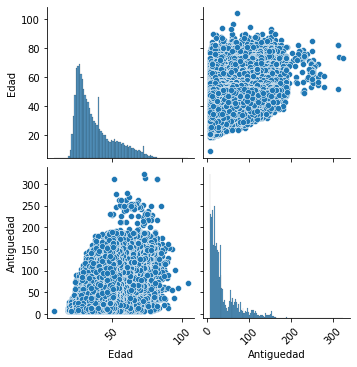

In [ ]:
import seaborn as sns

nuevo = df[['Edad', 'Antiguedad']]
g=sns.pairplot(nuevo, diag_kind='hist')
for ax in g.axes.flat:
  plt.setp(ax.get_xticklabels(),rotation=45)


x = df['Edad']
y = df['Antiguedad']

Acá podemos apreciar que existe una gran dispersión de datos, por ende se espera muy poco de la predicción del algoritmo, ya que estos no poseen una relación de dispersión que sea directamente proporcional, pongamoslo a prueba e imprimamos los resultados.

In [ ]:
import numpy as np
from sklearn import linear_model
from sklearn.metrics import r2_score

regr=linear_model.LinearRegression()

X=x[:, np.newaxis]
print(X)
print(regr.fit(X,y))
print(regr.coef_)
m=regr.coef_[0]
b=regr.intercept_
y_p=m*X+b
print('La edad de los primeros 5 valores es de:')
print(regr.predict(X)[0:5])
print('las edades reales de los primeros 5 valores es de:')
print(df['Edad'].head(5))
print('El valor de r2 es de:',r2_score(y,y_p))

[[43]
 [46]
 [46]
 ...
 [51]
 [47]
 [47]]
LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)
[1.48037543]
La edad de los primeros 5 valores es de:
[45.37835205 49.81947834 49.81947834 49.81947834 51.29985376]
las edades reales de los primeros 5 valores es de:
1    43
2    46
4    46
5    46
6    47
Name: Edad, dtype: int64
El valor de r2 es de: 0.3158667710340377


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  import sys


El valor del R2 nos dió un 31%, una nota muy mala, ya que ni siquiera está al azar alcanzando el 50%, para probar también se lanzaron los primeros 5 datos para poder predecir la edad, dando como resultados (en este caso vamos a truncar los valores) 45, 49, 49, 49 y 51. Siendo las edades reales de los clientes 43, 46, 46, 46, 47 respectivamente

##4.1.2 Regresión lineal múltiple
Un algoritmo de regresión lineal múltiple funciona de forma similar al que vimos anteriormente, la única gran diferencia que este tiene con su antecesor es que no se establece solamente una variable para poder predecir, como su nombre lo indica puede trabajar con tantas variables como amerite para poder tener un resultado predictivo, aunque no siempre "más es mejor", existe el riesgo de que disminuya su acierto cuando se establecen variables que no tienen significado con la etiqueta.

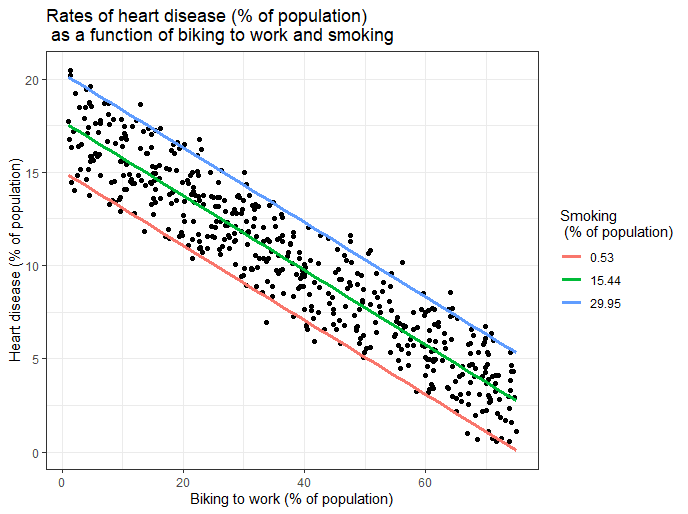

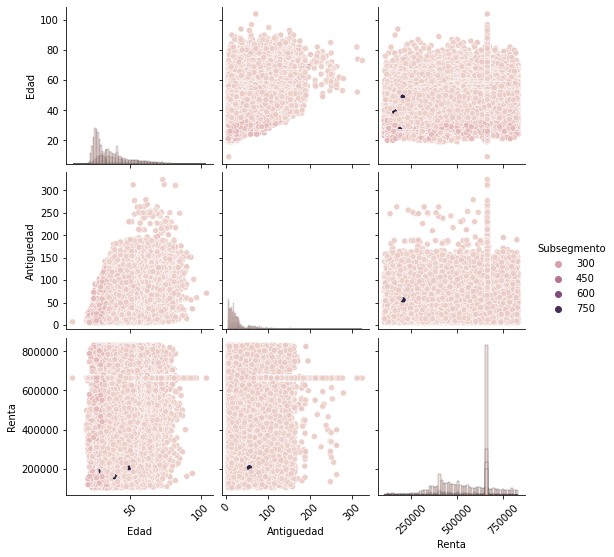

In [ ]:
import seaborn as sns

nuevo = df[['Edad', 'Antiguedad', 'Subsegmento', 'Renta']]
g=sns.pairplot(nuevo, hue='Subsegmento', diag_kind='hist')
for ax in g.axes.flat:
  plt.setp(ax.get_xticklabels(),rotation=45)

Acá se puede ver que las demás variables son mucho mas dispersas que en el algoritmo anterior, por lo que se esperararía un resultado mucho peor, y esto es porque estas variables estarían ensuciando el resultado de la relación anterior

In [ ]:
import numpy as np
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error


edad = df['Edad'].values
antiguedad = df['Antiguedad'].values
renta = df['Renta'].values
subsegmento = df['Subsegmento'].values

X=np.array([renta, antiguedad, subsegmento]).T
Y=np.array(edad)

reg=LinearRegression()
reg=reg.fit(X,Y)
Y_pred=reg.predict(X)
error=np.sqrt(mean_squared_error(Y, Y_pred))
r2=reg.score(X,Y)

print('El error es:', error)
print('El valor de r2 es:', r2)
print('Los coeficientes son:',reg.coef_)
renta = 143640
antiguedad = 69
subsegmento = 160
print('La edad del sujeto es de:', reg.predict([[renta, antiguedad, subsegmento]]))
print('La edad real del sujeto es de:', df.iloc[1,3])

El error es: 9.786193011164611
El valor de r2 es: 0.4716520160313047
Los coeficientes son: [ 4.53176386e-06  1.63876703e-01 -1.88959910e-01]
La edad del sujeto es de: [45.41046942]
La edad real del sujeto es de: 46


Y acá las teorías expuestas con anterioridad fueron erroneas, ya que el valor del R2 subió a un 47%, aproximandose al azar, puedo dar como análisis y veredicto que los datos añadidos como demás parametros sirvieron para apoyar a predecir la edad

#5.1 Modelo supervisado de clasificación

##5.1.1 Árbol de decisión
Un algoritmo de árbol de decisión es de tipo clasificatorio, como se dijo más arriba los algortimos supervisados se dividen en algoritmos de regresión y algoritmos de clasificación, en este caso lo que haremos será enviar un conjunto de variables significativas para el árbol y estos poder clasificarlos en diversos tipos, si lo llevamos al lado primitivo de un paradigma de programación lineal estaría siendo como un IF enforme que tiene muchos subconjuntos anidados


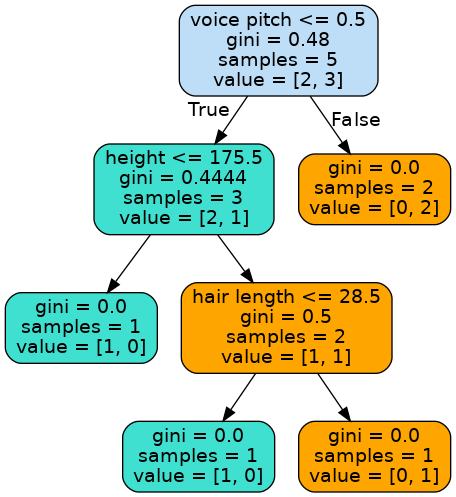

In [ ]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
from sklearn.tree import export_graphviz
import graphviz

Aquí definiremos las variables las cuales nos servirán como parámetros de entrada para poder predecir si el sujeto usa la aplicación web o no. ¿Porqué elegimos ahora determinar si el sujeto usa la aplicación web?, la respuesta es simple, un algoritmo de clasificación debe en la posibilidad, poder predecir variables de tipo clasificatorias, en este caso la columna "Internauta" es de tipo binaria

In [ ]:
predictor=df[['Subsegmento', 'Renta', 'Antiguedad', 'Edad']]
target=df.Internauta
predictor

,Subsegmento,Renta,Antiguedad,Edad
1,160,663077.0,130,43
2,160,143640.0,69,46
4,151,172447.0,134,46
5,170,805250.0,116,46
6,170,707664.0,67,47
...,...,...,...,...
51119,160,414316.0,23,44
51120,160,364978.0,57,51
51121,170,625376.0,39,51
51122,160,806220.0,153,47


Acá solamente declararemos variables para poder dibujar el árbol más adelante

In [ ]:
predictor_labels= ['Subsegmento', 'Renta', 'Antiguedad', 'Edad']
target_labels=['No', 'Si']

Y entrenamos nuestro modelo, cabe destacar que en la primera linea solamente separamos los datos que rescatamos para que se dividan, estos para verificar el resultado y el % de acierto, también dejaremos los hiperparámetros por defecto ya que primero evaluaremos si ocurre un sobre ajuste.

In [ ]:
X_entrenamiento, X_test, y_entrenamiento, y_test = train_test_split(predictor, target)

In [ ]:
arbol=DecisionTreeClassifier()
arbol.fit(X_entrenamiento, y_entrenamiento)

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=None, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=None, splitter='best')

In [ ]:
arbol.score(X_test, y_test)

0.6610055651506429

Acá obtenemos el resultado del entrenamiento con las variables de prueba, obviamente por sentido común debe ser inferior al de entrenamiento, ya que por defecto solo usa en este caso el 20% de la partición de los datos

In [ ]:
arbol.score(X_entrenamiento, y_entrenamiento)

0.9591569116612294

Nuestro porcentaje fue de un 96% casi, mucho más que excelente, definitivamente un algoritmo de clasificación era lo mejor para llevar a cabo un modelo predictivo, en la siguiente línea se dibujará el árbol del modelo que usamos en este algoritmo. El modelo no se sobreajustó ya que respetó la naturaleza de las variables cuantitativas, no estableciendolas como variables clasificatorias y no dándole en el gusto a los datos del algoritmo, un sobre ajuste se empieza a considerar desde un rango de aceptación de un 98% en adelante. Por ende no será necesario ajustar los hiperparámetros como la profundidad o las hojas.

In [ ]:
export_graphviz(arbol, out_file='arbol.dot', class_names=target_labels,
                feature_names=predictor_labels, impurity=False, filled=True)

with open('arbol.dot') as f:
  dot_graph=f.read()
graphviz.Source(dot_graph)

##5.1.2 Naive Bayes
El algoritmo de Naive Bayes es uno de los modelos de clasificación más simples basado en las probabilidades de hipótesis y se apoya en la matriz de confusión, es decir, determina una cantidad de aciertos positivos y negativos, y una cantidad de fallos positivos y negativos. A esto se le conocen como verdaderos positivos, verdaderos negativos, falsos positivos y falsos negativos

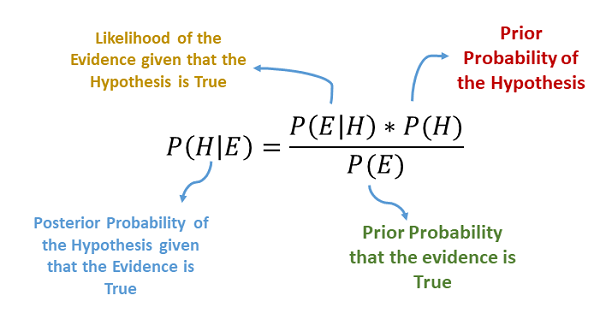

In [ ]:
from sklearn.naive_bayes import GaussianNB

x=df[['Subsegmento', 'Renta', 'Antiguedad', 'Edad']]
y=df.Internauta

X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.2)


Primero empezaremos diviendo la data como se hizo anteriormente en datos de entrenamiento y prueba para poder entrenar el modelo y obtener los resultados

In [ ]:
NB = GaussianNB()
NB.fit(X_train, y_train)

GaussianNB(priors=None, var_smoothing=1e-09)

In [ ]:
y_pred = NB.predict(X_test)

Acá veremos en su totalidad lo que indica la matriz de confusión, los valores acertados los encontramos en el valor de la coordenada primera fila/primera columna y segunda fila/segunda columna, los valores erroneos son los que se encuentran en la segunda columna/primera fila y la primera columna/segunda fila

In [ ]:
from sklearn.metrics import confusion_matrix
matriz = confusion_matrix(y_test, y_pred)
print('matriz de confusión:')
print(matriz)

matriz de confusión:
[[1117 1548]
 [ 703 4970]]


En total hubieron 6087 aciertos y 2251 fallos de un total de 8338 datos

In [ ]:
from sklearn.metrics import precision_score
precision = precision_score(y_test, y_pred)
print('precisión del modelo:')
print(precision)

precisión del modelo:
0.7625038355323719


La precisión del modelo es del 76% muy bien aceptado aunque no supera el modelo de árbol de decisión que tiene un 96% de acierto

#6.1 Evaluación
Definitivamente si se usa un algoritmo de tipo supervisado lo mejor será establecer un modelo clasificatorio, ya que las variables no tienen un comportamiento directamente proporcional y esto es debido a su naturaleza cualitativa en algunas ocasiones. El modelo que mejor se ajusta al caso fue el del árbol de decisión con un 95% de acierto, seguido de el modelo Naive Bayes con un 76% de precisión. Siendo los modelos de regresión peor evaluados, con la regresión lineal con una precisión del 31% seguido de la regresión lineal múltiple con una precisión del 47%

#6.1 Modelos no supervisados de Cluster

##6.1.1 Clustering jerárquico

In [ ]:
import scipy.cluster.hierarchy as sch
from 